# Clustering

## Shlukovací algoritmy v knihovně Scikit-learn

Scikit-learn nabízí řadu algoritmů pro shlukovou analýzu (clustering), které umožňují identifikovat přirozené skupiny v datech. V tomto článku se zaměříme na 5 nejpoužívanějších shlukovacích algoritmů, jejich popis a implementaci v Pythonu.

## 1. KMeans

### Popis

KMeans je nejpopulárnější shlukovací algoritmus, který rozděluje data do K shluků, kde každý bod náleží ke shluku s nejbližším středem (centroidem). Algoritmus iterativně přepočítává středy shluků, dokud nedosáhne konvergence.

### Kdy a kde použít

- Když očekáváte kulovité shluky podobné velikosti
- Pro velké datasety (algoritmus je relativně efektivní)
- Pro aplikace jako segmentace zákazníků, komprese obrazu, detekce anomálií
- Když potřebujete jednoduché a rychlé řešení

### Výhody a nevýhody

**Výhody:**
- Jednoduchý a intuitivní algoritmus
- Výpočetně efektivní (lineární časová složitost)
- Snadno implementovatelný
- Dobře funguje na velkých datasetech

**Nevýhody:**
- Vyžaduje předem určení počtu shluků K
- Citlivý na inicializaci center
- Předpokládá kulovité shluky stejné velikosti
- Citlivý na odlehlé hodnoty
- Špatně funguje pro shluky různých tvarů

### Ukázka kódu

In [1]:
# !pip install yellowbrick

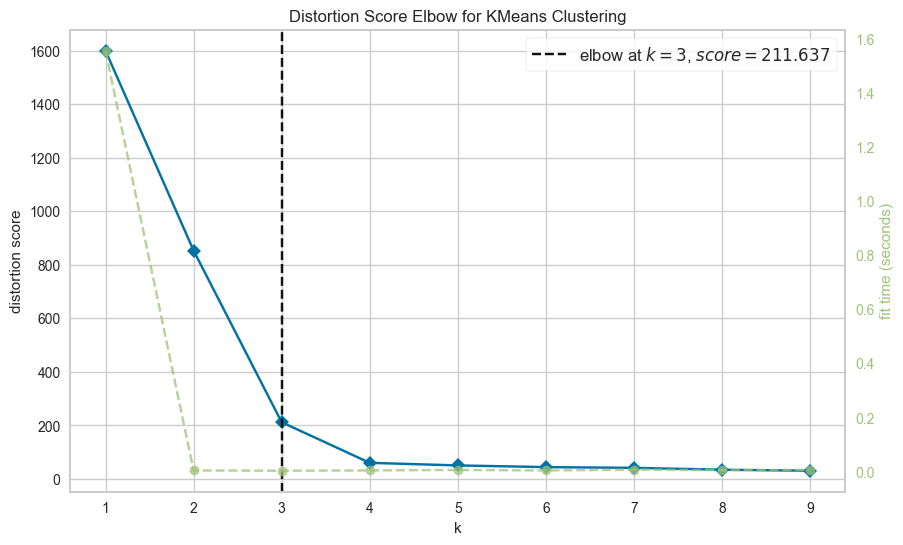

Optimální počet shluků podle metody loktu: 3


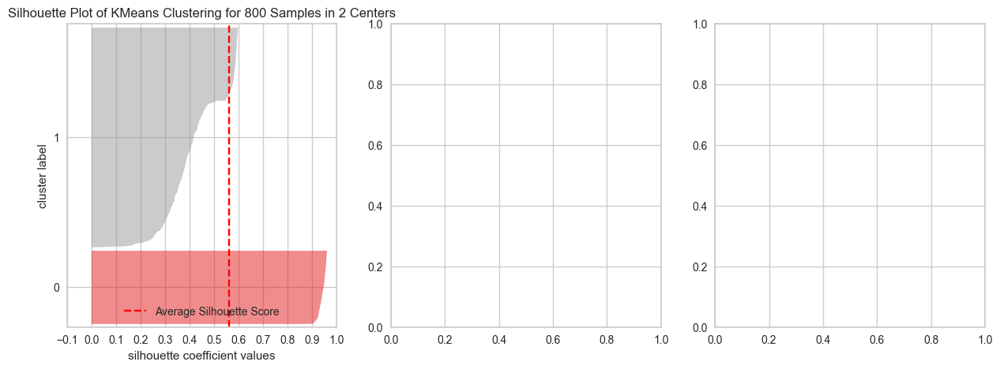

Průměrné silhouette skóre: 0.7307


<Figure size 800x550 with 0 Axes>

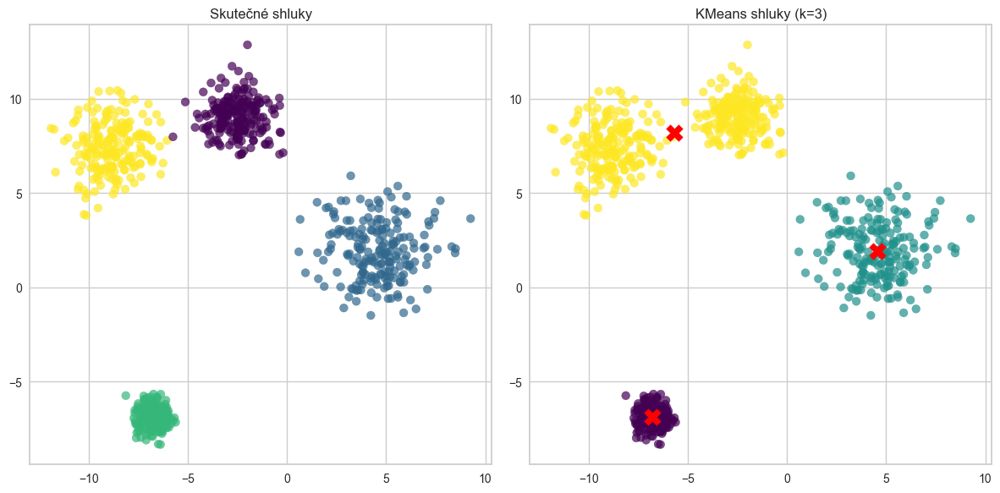

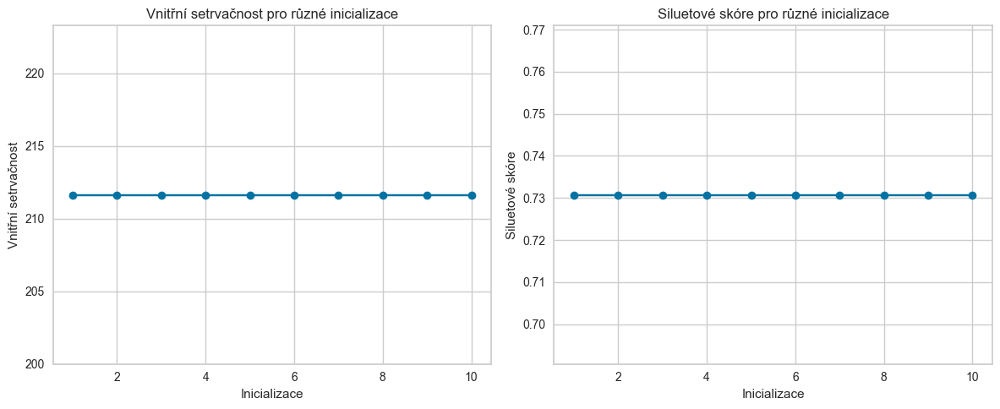

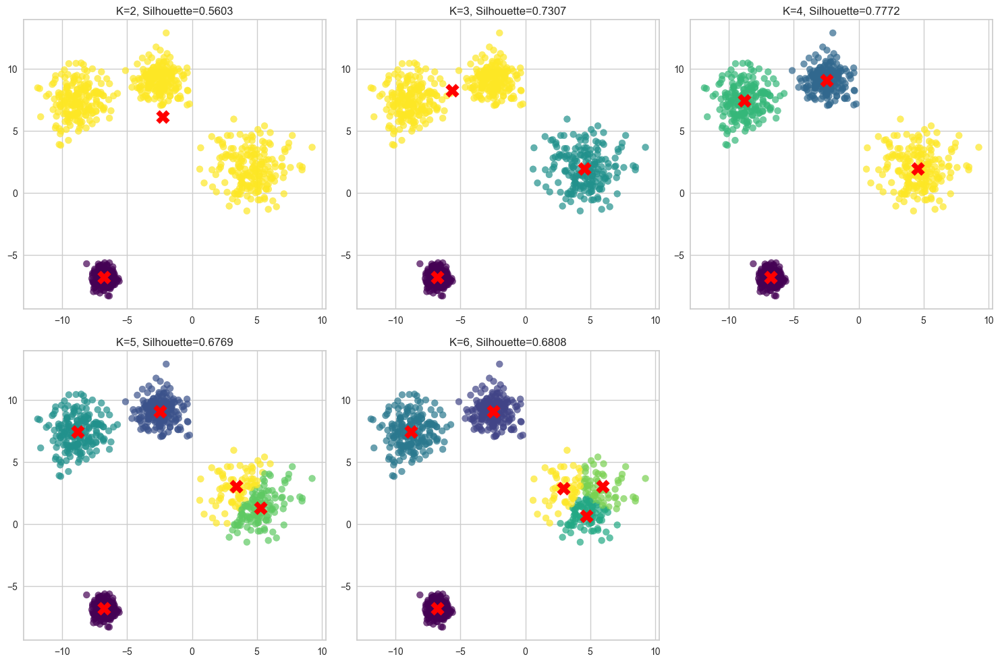

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Generování syntetických dat
X, y_true = make_blobs(n_samples=800, centers=4, cluster_std=[1.0, 1.5, 0.5, 1.2],
                       random_state=42)

# Standardizace dat
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Určení optimálního počtu shluků pomocí metody loktu
fig, ax = plt.subplots(figsize=(10, 6))
visualizer = KElbowVisualizer(KMeans(random_state=42), k=(1, 10), ax=ax)
visualizer.fit(X_scaled)
optimal_k = visualizer.elbow_value_
visualizer.show()

print(f"Optimální počet shluků podle metody loktu: {optimal_k}")

# Porovnání siluet pro různé hodnoty K
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for i, k in enumerate([2, 3, 4]):
    model = KMeans(n_clusters=k, random_state=42)
    silhouette = SilhouetteVisualizer(model, ax=axs[i])
    silhouette.fit(X_scaled)
    silhouette.show()

plt.tight_layout()

# Aplikace KMeans s optimálním počtem shluků
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
y_pred = kmeans.fit_predict(X_scaled)

# Vyhodnocení kvality shlukování
silhouette_avg = silhouette_score(X_scaled, y_pred)
print(f"Průměrné silhouette skóre: {silhouette_avg:.4f}")

# Vizualizace výsledků
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='viridis', s=50, alpha=0.7)
plt.title('Skutečné shluky')
plt.subplot(1, 2, 2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
centers = scaler.inverse_transform(kmeans.cluster_centers_)
plt.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=200)
plt.title(f'KMeans shluky (k={optimal_k})')
plt.tight_layout()
plt.show()

# Analýza s různými inicializacemi
inertias = []
silhouettes = []
for i in range(10):
    kmeans = KMeans(n_clusters=optimal_k, random_state=i, n_init=1)
    y_pred = kmeans.fit_predict(X_scaled)
    inertias.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(X_scaled, y_pred))

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, 11), inertias, 'o-')
plt.xlabel('Inicializace')
plt.ylabel('Vnitřní setrvačnost')
plt.title('Vnitřní setrvačnost pro různé inicializace')
plt.subplot(1, 2, 2)
plt.plot(range(1, 11), silhouettes, 'o-')
plt.xlabel('Inicializace')
plt.ylabel('Siluetové skóre')
plt.title('Siluetové skóre pro různé inicializace')
plt.tight_layout()
plt.show()

# Vizualizace vlivu počtu shluků na výsledky
plt.figure(figsize=(15, 10))
for i, k in enumerate([2, 3, 4, 5, 6]):
    kmeans = KMeans(n_clusters=k, random_state=42)
    y_pred = kmeans.fit_predict(X_scaled)
    
    plt.subplot(2, 3, i+1)
    plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
    centers = scaler.inverse_transform(kmeans.cluster_centers_)
    plt.scatter(centers[:, 0], centers[:, 1], c='red', marker='X', s=200)
    plt.title(f'K={k}, Silhouette={silhouette_score(X_scaled, y_pred):.4f}')

plt.tight_layout()
plt.show()

## 2. DBSCAN

### Popis

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) je algoritmus založený na hustotě bodů. Identifikuje shluky jako oblasti vysoké hustoty oddělené oblastmi nízké hustoty. Automaticky určuje počet shluků a dokáže identifikovat odlehlé hodnoty.

### Kdy a kde použít

- Když očekáváte shluky nepravidelného tvaru
- Když neznáte předem počet shluků
- Když data obsahují šum nebo odlehlé hodnoty
- Pro prostorová data a analýzu geografických dat
- Pro detekci anomálií

### Výhody a nevýhody

**Výhody:**
- Nevyžaduje předem určený počet shluků
- Může najít shluky libovolného tvaru
- Identifikuje šum a odlehlé hodnoty
- Robustní vůči šumu
- Vhodný pro data založená na hustotě

**Nevýhody:**
- Citlivý na parametry (eps, min_samples)
- Obtížné určení optimálních parametrů
- Problematický pro datasety s různou hustotou
- Výpočetně náročnější než KMeans
- Méně efektivní pro vysocedimenzionální data

### Ukázka kódu

<Figure size 2000x2000 with 0 Axes>

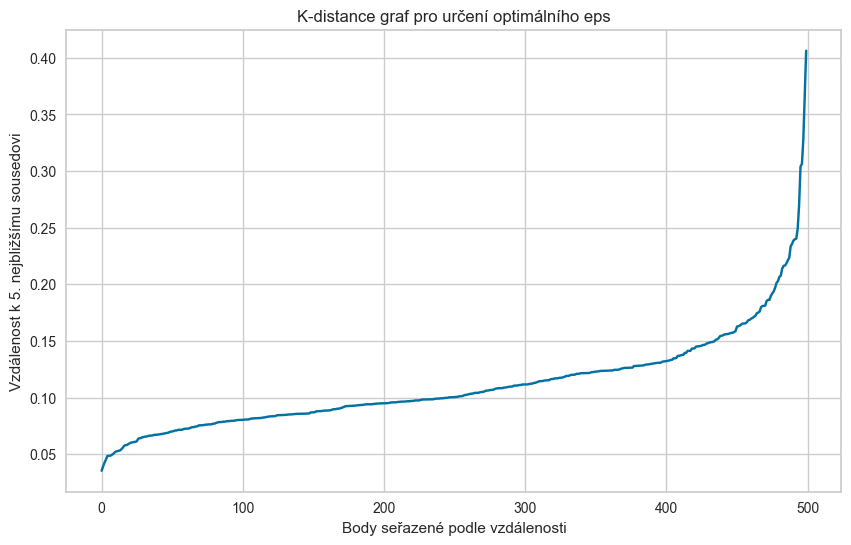

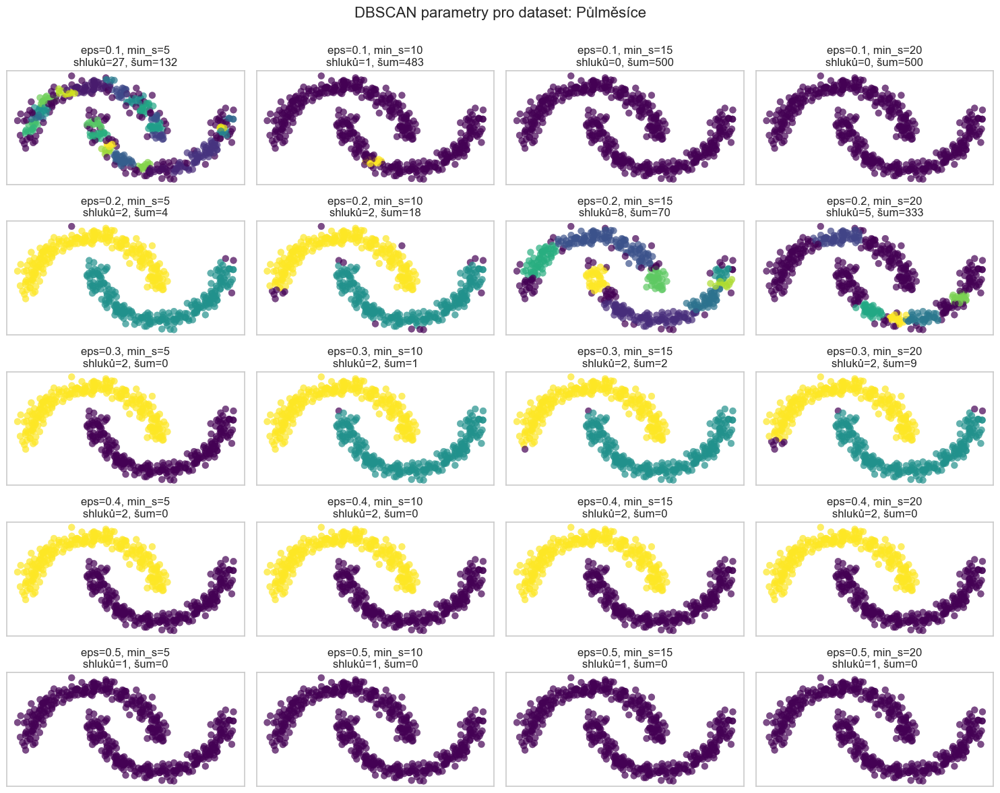


Dataset: Půlměsíce
Optimální parametry: eps=0.3, min_samples=5
Počet nalezených shluků: 2
Počet bodů identifikovaných jako šum: 0 (0.00%)
Průměrné silhouette skóre: 0.3836


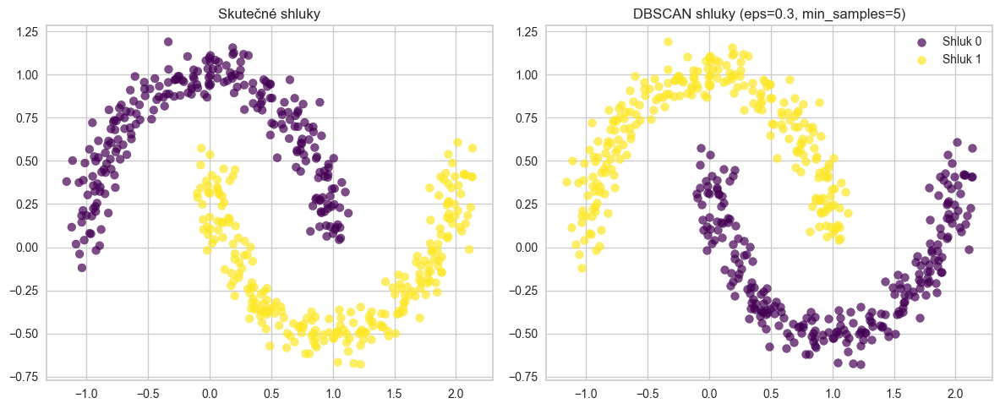

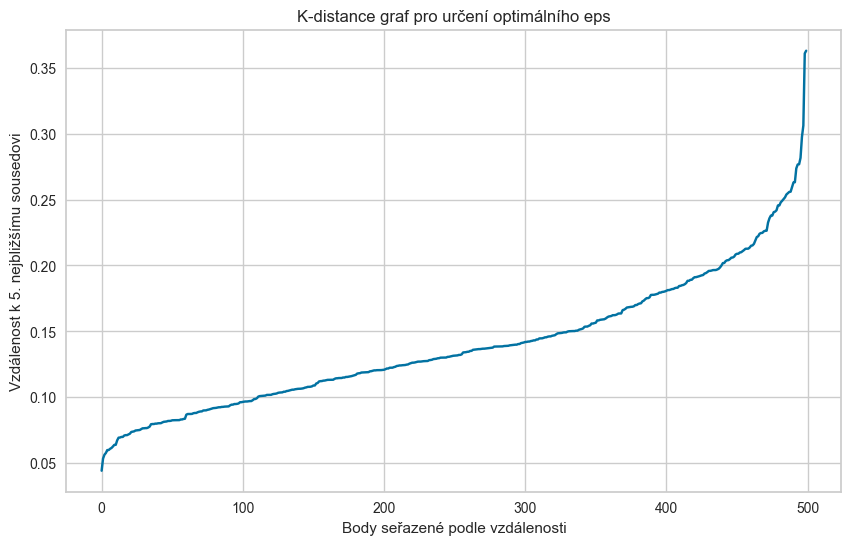

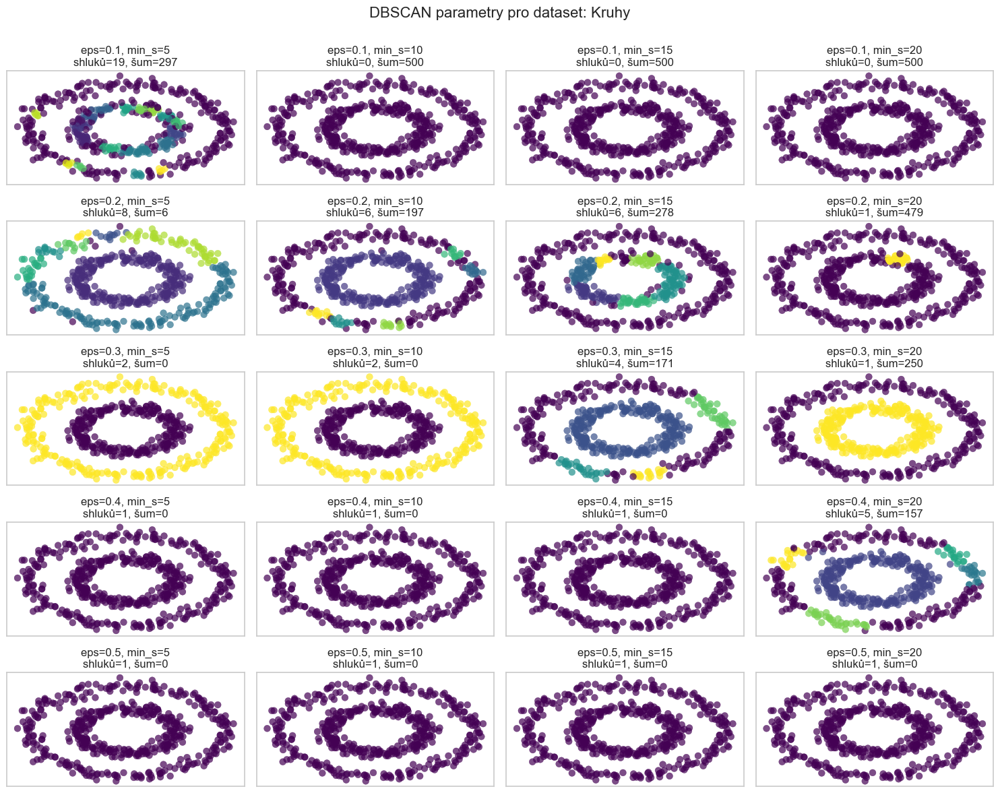


Dataset: Kruhy
Optimální parametry: eps=0.2, min_samples=5
Počet nalezených shluků: 8
Počet bodů identifikovaných jako šum: 6 (1.20%)
Průměrné silhouette skóre (bez šumu): 0.0950


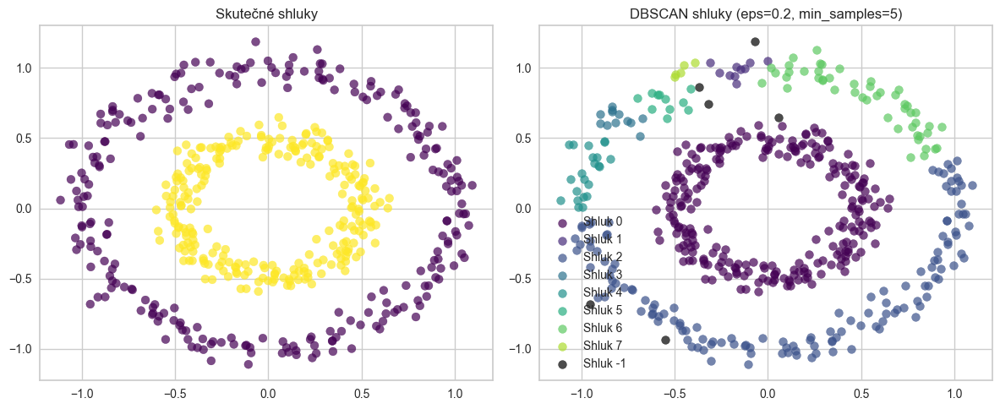

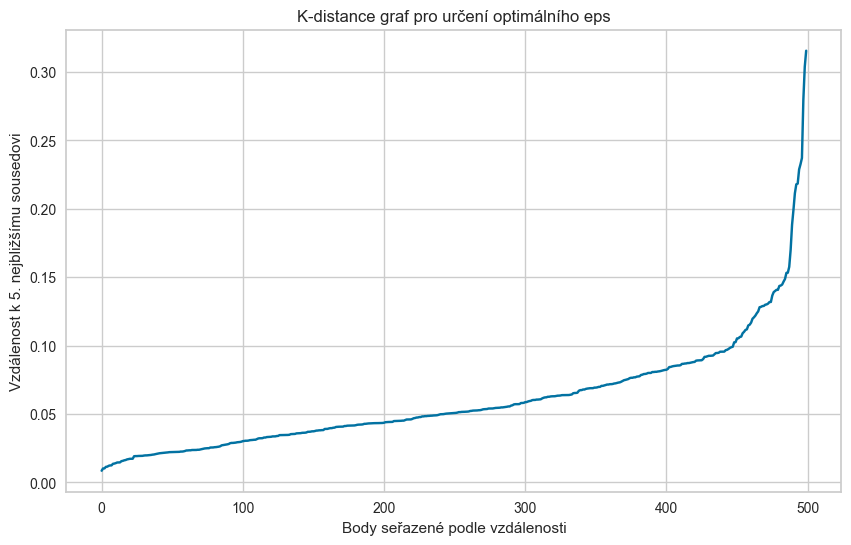

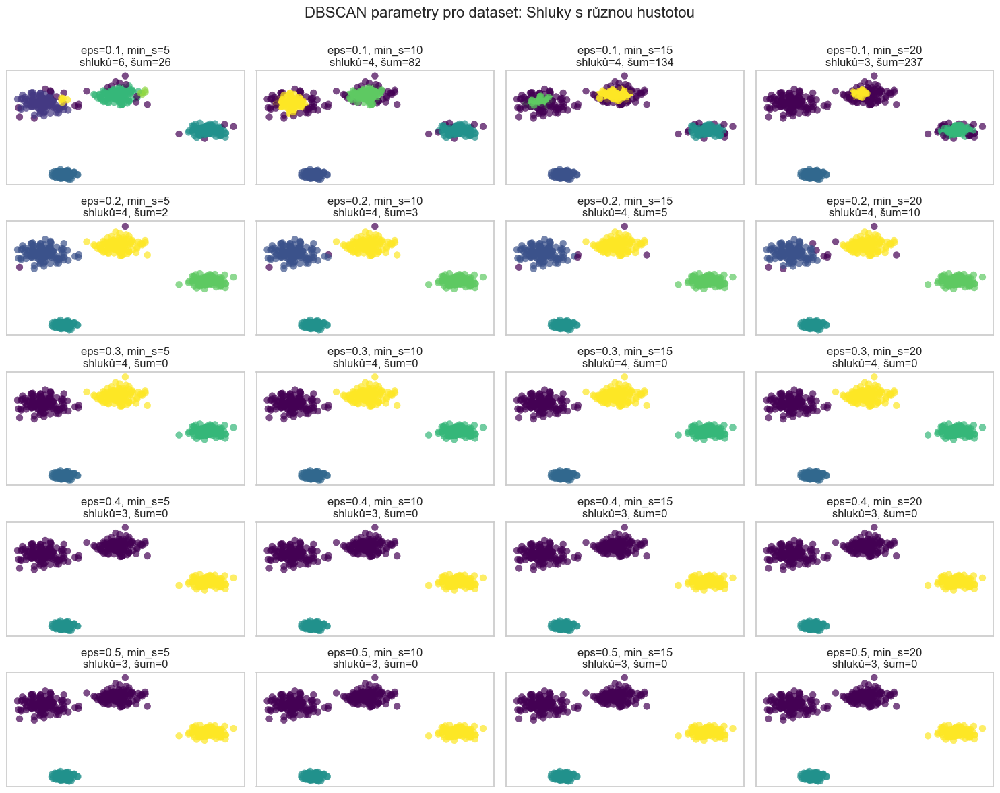


Dataset: Shluky s různou hustotou
Optimální parametry: eps=0.3, min_samples=10
Počet nalezených shluků: 4
Počet bodů identifikovaných jako šum: 0 (0.00%)
Průměrné silhouette skóre: 0.8182


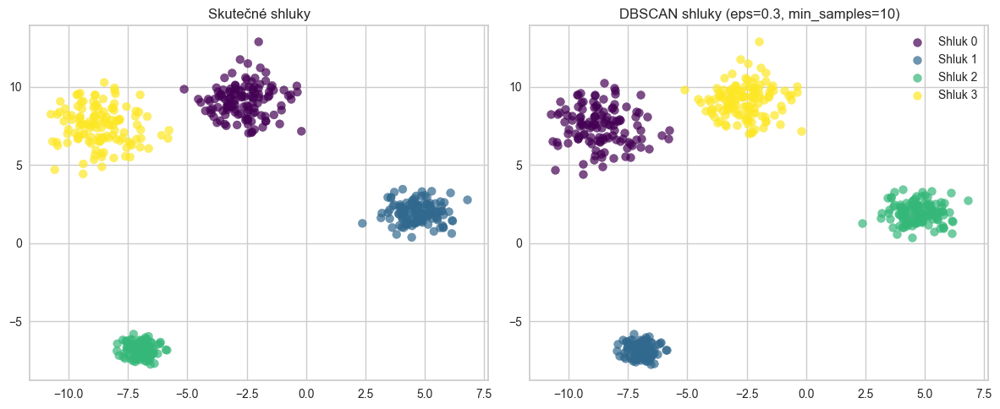

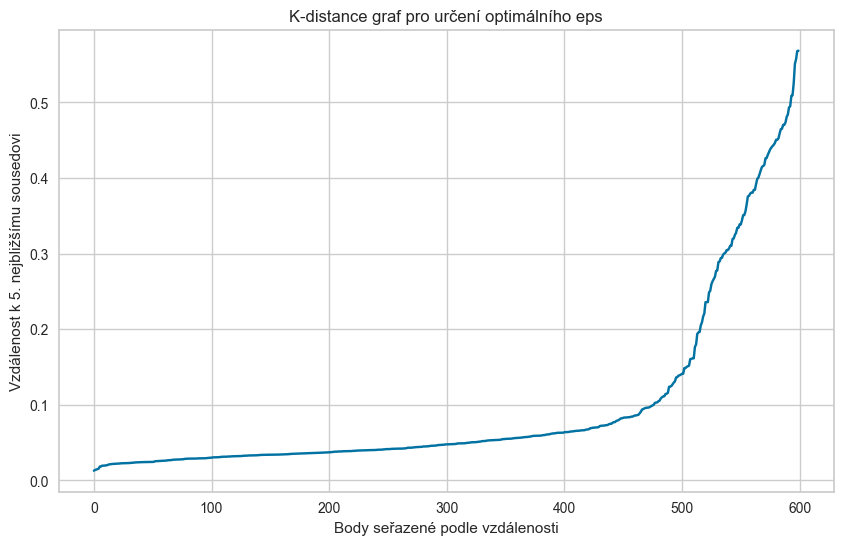

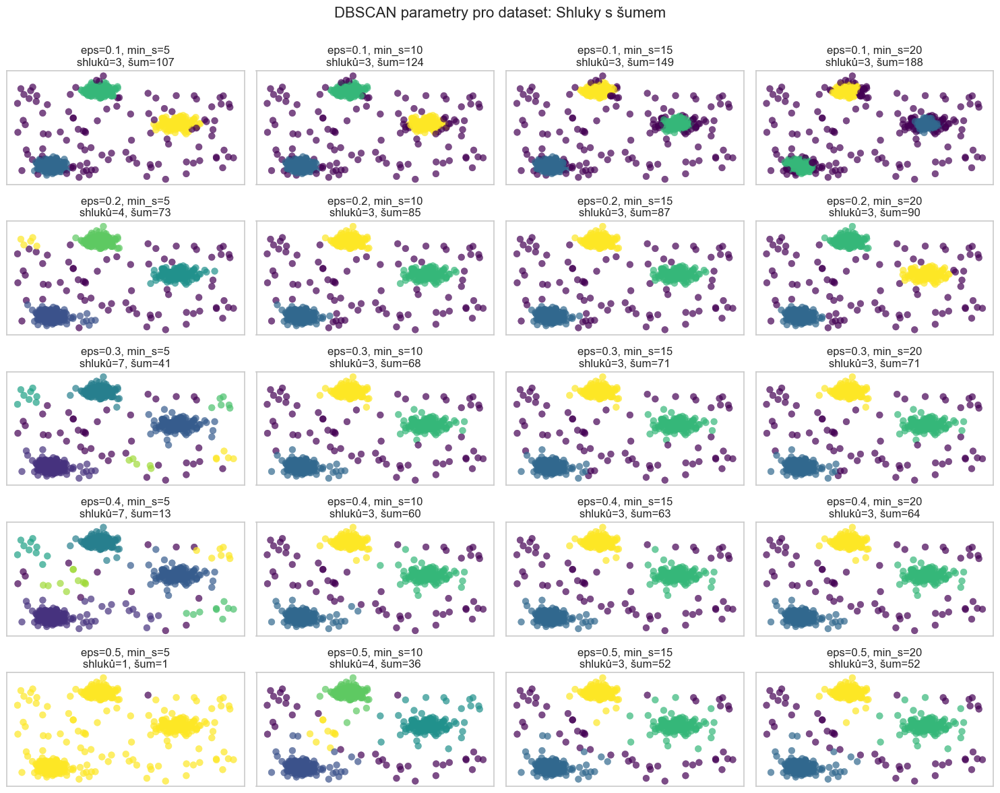


Dataset: Shluky s šumem
Optimální parametry: eps=0.4, min_samples=10
Počet nalezených shluků: 3
Počet bodů identifikovaných jako šum: 60 (10.00%)
Průměrné silhouette skóre (bez šumu): 0.8516


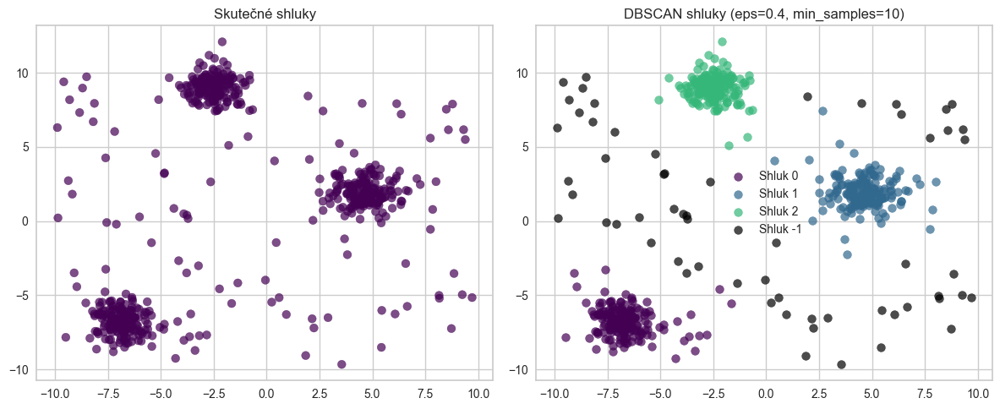

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons, make_circles, make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors

# Vytvoření různých typů syntetických dat
n_samples = 500

# Dataset 1: Půlměsíce
X1, y1 = make_moons(n_samples=n_samples, noise=0.08, random_state=42)

# Dataset 2: Kruhy
X2, y2 = make_circles(n_samples=n_samples, noise=0.06, factor=0.5, random_state=42)

# Dataset 3: Shluky s různou hustotou
X3, y3 = make_blobs(n_samples=n_samples, centers=4, 
                   cluster_std=[1.0, 0.7, 0.4, 1.2], random_state=42)

# Dataset 4: Shluky s šumem
X4, y4 = make_blobs(n_samples=n_samples, centers=3, cluster_std=0.8, random_state=42)
# Přidání šumu
rng = np.random.RandomState(42)
X4 = np.vstack([X4, rng.uniform(-10, 10, (100, 2))])
y4 = np.hstack([y4, np.full(100, -1)])  # -1 pro šum

datasets = [
    ("Půlměsíce", X1, y1),
    ("Kruhy", X2, y2),
    ("Shluky s různou hustotou", X3, y3),
    ("Shluky s šumem", X4, np.ones(len(y4)))
]

# Funkce pro nalezení optimálního parametru eps
def find_optimal_eps(X, k=5):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    
    plt.figure(figsize=(10, 6))
    plt.plot(range(len(distances)), distances)
    plt.xlabel('Body seřazené podle vzdálenosti')
    plt.ylabel(f'Vzdálenost k {k}. nejbližšímu sousedovi')
    plt.title('K-distance graf pro určení optimálního eps')
    plt.grid(True)
    plt.show()
    
    return distances

# Aplikace DBSCAN na každý dataset
plt.figure(figsize=(20, 20))
for i, (name, X, y) in enumerate(datasets):
    # Standardizace dat
    X_scaled = StandardScaler().fit_transform(X)
    
    # Nalezení optimálního eps
    distances = find_optimal_eps(X_scaled)
    
    # Testování různých parametrů
    epss = [0.1, 0.2, 0.3, 0.4, 0.5]
    min_samples_list = [5, 10, 15, 20]
    
    plt.figure(figsize=(15, 12))
    plot_num = 1
    
    for eps in epss:
        for min_samples in min_samples_list:
            # Aplikace DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            clusters = dbscan.fit_predict(X_scaled)
            
            # Počet shluků (kromě šumu s označením -1)
            n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
            noise_points = list(clusters).count(-1)
            
            plt.subplot(len(epss), len(min_samples_list), plot_num)
            plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap='viridis', s=50, alpha=0.7)
            plt.title(f'eps={eps}, min_s={min_samples}\nshluků={n_clusters}, šum={noise_points}')
            plt.xticks([])
            plt.yticks([])
            plot_num += 1
            
    plt.suptitle(f'DBSCAN parametry pro dataset: {name}', fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()
    
    # Aplikace optimálního DBSCAN
    if name == "Půlměsíce":
        best_eps, best_min_samples = 0.3, 5
    elif name == "Kruhy":
        best_eps, best_min_samples = 0.2, 5
    elif name == "Shluky s různou hustotou":
        best_eps, best_min_samples = 0.3, 10
    else:
        best_eps, best_min_samples = 0.4, 10
        
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
    y_pred = dbscan.fit_predict(X_scaled)
    
    # Statistiky
    n_clusters = len(set(y_pred)) - (1 if -1 in y_pred else 0)
    noise_points = list(y_pred).count(-1)
    
    print(f"\nDataset: {name}")
    print(f"Optimální parametry: eps={best_eps}, min_samples={best_min_samples}")
    print(f"Počet nalezených shluků: {n_clusters}")
    print(f"Počet bodů identifikovaných jako šum: {noise_points} ({noise_points/len(y_pred)*100:.2f}%)")
    
    if len(set(y_pred)) > 1 and -1 not in set(y_pred):
        silhouette_avg = silhouette_score(X_scaled, y_pred)
        print(f"Průměrné silhouette skóre: {silhouette_avg:.4f}")
    elif len(set(y_pred)) > 1:
        # Výpočet silhouette skóre bez šumových bodů
        mask = y_pred != -1
        if sum(mask) > 1:  # Musíme mít alespoň 2 body
            silhouette_avg = silhouette_score(X_scaled[mask], y_pred[mask])
            print(f"Průměrné silhouette skóre (bez šumu): {silhouette_avg:.4f}")
    
    # Vizualizace výsledků
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', s=50, alpha=0.7)
    plt.title('Skutečné shluky')
    
    plt.subplot(1, 2, 2)
    colors = plt.cm.viridis(np.linspace(0, 1, len(set(y_pred))))
    for k, col in zip(set(y_pred), colors):
        if k == -1:
            col = [0, 0, 0, 1]  # černá barva pro šum
            
        mask = y_pred == k
        plt.scatter(X[mask, 0], X[mask, 1], c=[col], label=f'Shluk {k}', s=50, alpha=0.7)
    
    plt.title(f'DBSCAN shluky (eps={best_eps}, min_samples={best_min_samples})')
    plt.legend()
    plt.tight_layout()
    plt.show()

## 3. AgglomerativeClustering

### Popis

AgglomerativeClustering provádí hierarchické shlukování. Začíná tím, že každý bod je samostatným shlukem a postupně spojuje nejbližší shluky, dokud nedosáhne požadovaného počtu shluků. Existuje několik metod pro měření vzdálenosti mezi shluky, jako je "ward", "complete", "average" a "single".

### Kdy a kde použít

- Když potřebujete hierarchickou strukturu shluků
- Když nepředpokládáte kulovité shluky
- Pro menší až středně velké datasety
- Když potřebujete vizualizaci pomocí dendrogramu
- Pro taxonomii, analýzu dokumentů či genů

### Výhody a nevýhody

**Výhody:**
- Nepotřebuje předem určit počet shluků (lze určit později pomocí dendrogramu)
- Vytváří hierarchickou strukturu shluků
- Funguje dobře pro shluky různých tvarů
- Flexibilita díky různým metrikám vzdálenosti
- Nevytváří předpoklady o tvaru shluků

**Nevýhody:**
- Výpočetně náročný pro velké datasety (O(n^3) časová složitost)
- Citlivý na šum a odlehlé hodnoty
- Rozhodnutí je nevratné (nelze zrušit sloučení shluků)
- Předpokládá specifická kritéria sloučení, která nemusí vždy odpovídat datům

### Ukázka kódu

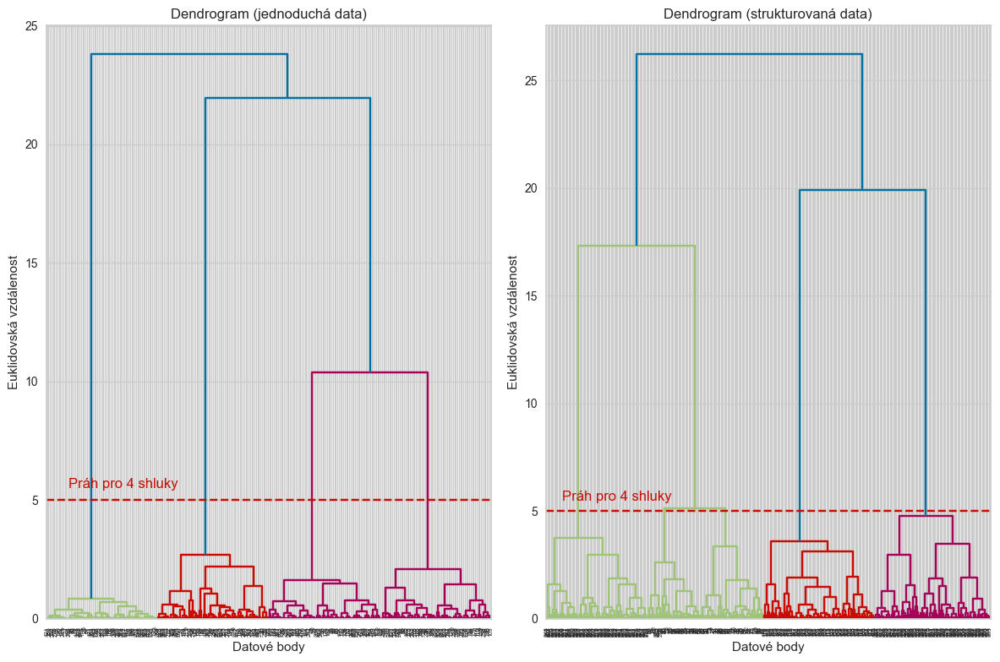

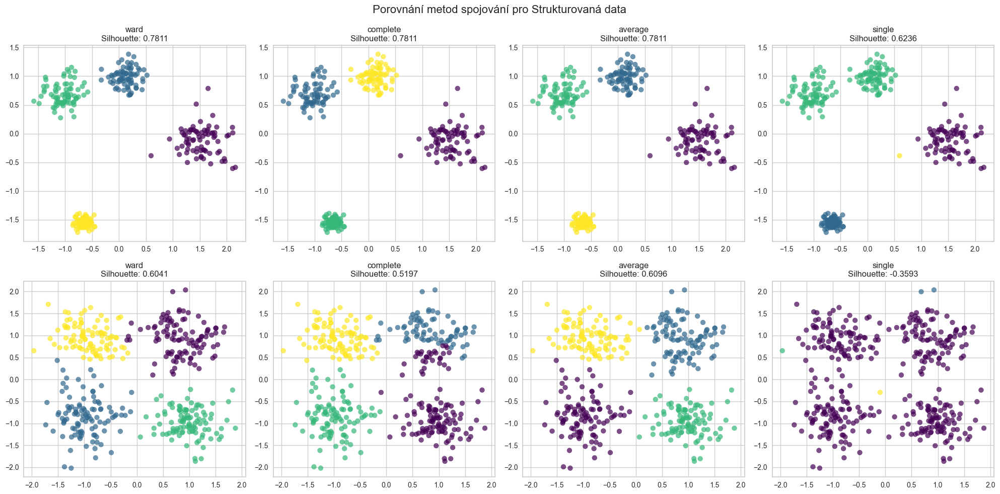

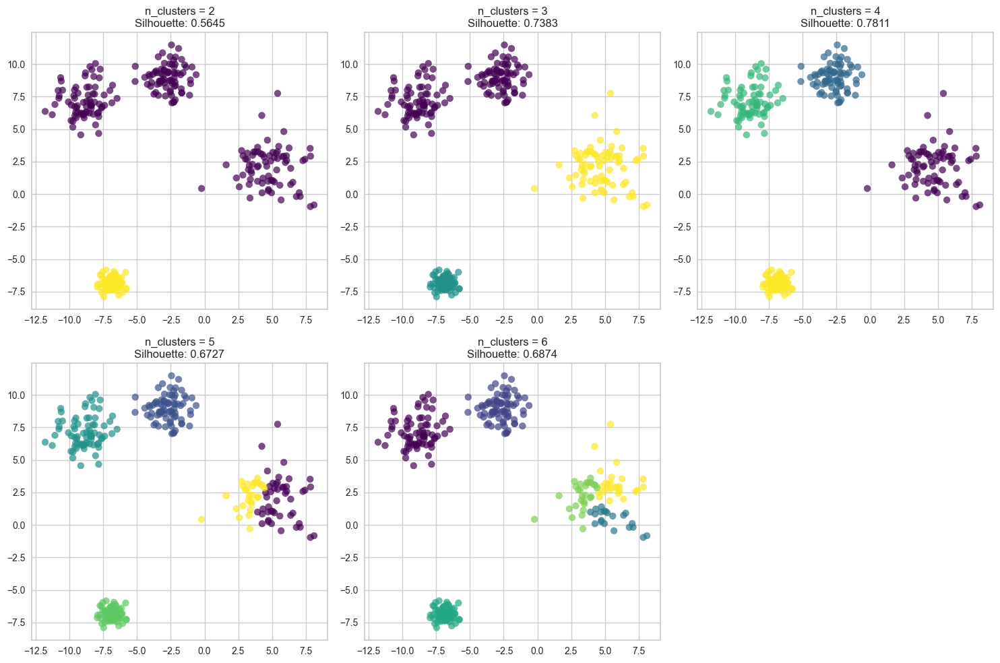

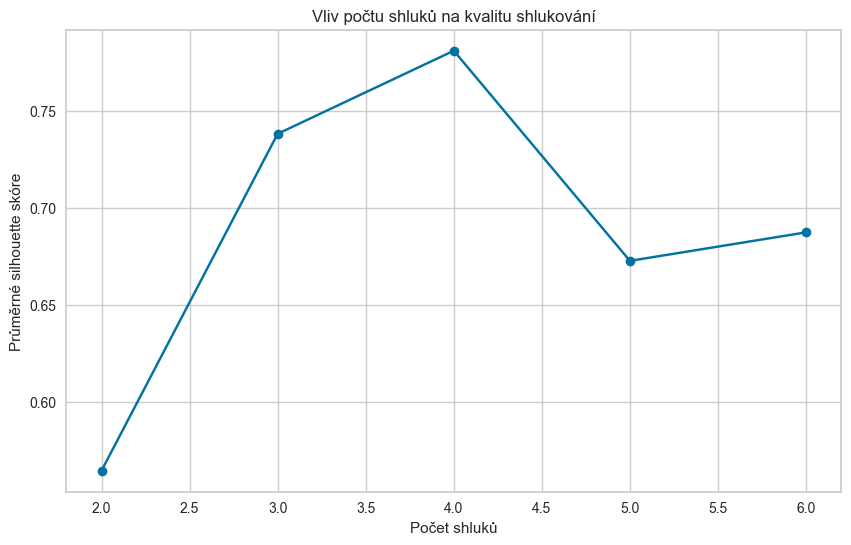

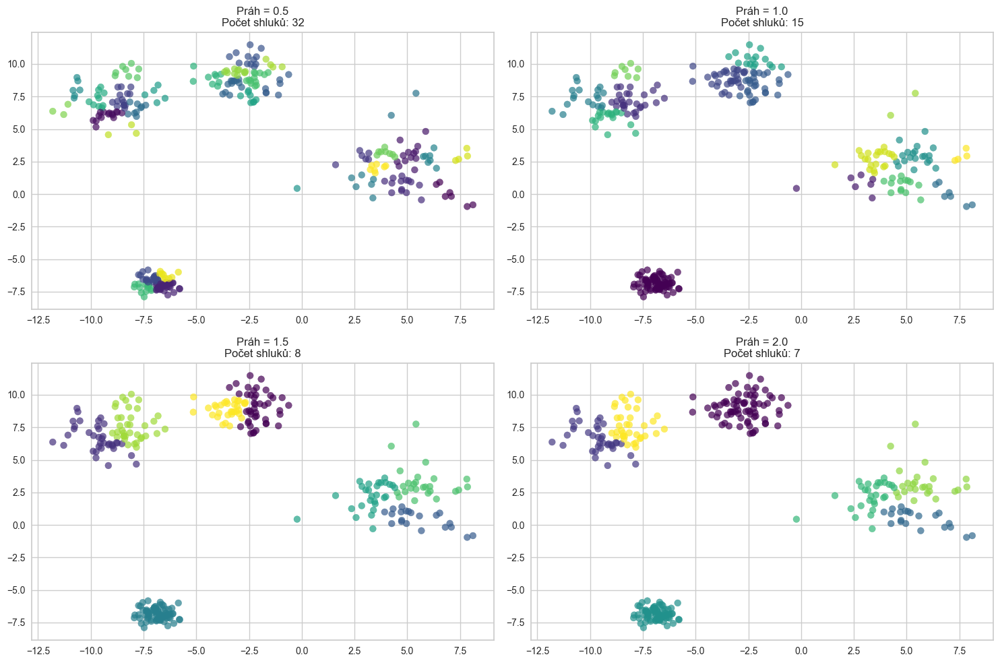

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as sch
from matplotlib.colors import ListedColormap

# Generování syntetických dat
X, y = make_blobs(n_samples=300, centers=4, 
                 cluster_std=[1.0, 1.5, 0.5, 1.2],
                 random_state=42)

# Přidání struktury do dat - dva větší shluky rozdělené na podsekce
X_structured = np.vstack([
    np.random.randn(100, 2) + np.array([5, 5]),
    np.random.randn(100, 2) + np.array([5, 0]),
    np.random.randn(100, 2) + np.array([0, 5]),
    np.random.randn(100, 2) + np.array([0, 0]),
])
y_structured = np.hstack([np.zeros(100), np.ones(100), 2*np.ones(100), 3*np.ones(100)])

# Standardizace dat
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_structured_scaled = scaler.fit_transform(X_structured)

# Vizualizace dendrogramu pro určení optimálního počtu shluků
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
dendrogram = sch.dendrogram(sch.linkage(X_scaled, method='ward'))
plt.title('Dendrogram (jednoduchá data)')
plt.xlabel('Datové body')
plt.ylabel('Euklidovská vzdálenost')
plt.axhline(y=5, color='r', linestyle='--')
plt.text(150, 5.5, 'Práh pro 4 shluky', color='r')

plt.subplot(1, 2, 2)
dendrogram = sch.dendrogram(sch.linkage(X_structured_scaled, method='ward'))
plt.title('Dendrogram (strukturovaná data)')
plt.xlabel('Datové body')
plt.ylabel('Euklidovská vzdálenost')
plt.axhline(y=5, color='r', linestyle='--')
plt.text(150, 5.5, 'Práh pro 4 shluky', color='r')

plt.tight_layout()
plt.show()

# Porovnání různých metod spojování shluků
linkages = ['ward', 'complete', 'average', 'single']
n_clusters = 4

plt.figure(figsize=(20, 10))
for data_idx, (X_data, y_data, title) in enumerate([
    (X_scaled, y, "Jednoduchá data"), 
    (X_structured_scaled, y_structured, "Strukturovaná data")
]):
    for i, linkage in enumerate(linkages):
        # Vytvoření modelu
        model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
        y_pred = model.fit_predict(X_data)
        
        # Výpočet silhouette skóre
        silhouette_avg = silhouette_score(X_data, y_pred)
        
        # Vizualizace výsledků
        plt.subplot(2, 4, i + 1 + data_idx * 4)
        plt.scatter(X_data[:, 0], X_data[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
        plt.title(f'{linkage}\nSilhouette: {silhouette_avg:.4f}')
        
    plt.suptitle(f"Porovnání metod spojování pro {title}", fontsize=16)

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Zkoumání vlivu počtu shluků
n_clusters_range = [2, 3, 4, 5, 6]
silhouette_scores = []

plt.figure(figsize=(15, 10))
for i, n_clust in enumerate(n_clusters_range):
    # Vytvoření a aplikace modelu
    model = AgglomerativeClustering(n_clusters=n_clust, linkage='ward')
    y_pred = model.fit_predict(X_scaled)
    
    # Výpočet silhouette skóre
    silhouette_avg = silhouette_score(X_scaled, y_pred)
    silhouette_scores.append(silhouette_avg)
    
    # Vizualizace
    plt.subplot(2, 3, i+1)
    plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
    plt.title(f'n_clusters = {n_clust}\nSilhouette: {silhouette_avg:.4f}')

plt.tight_layout()
plt.show()

# Graf závislosti silhouette skóre na počtu shluků
plt.figure(figsize=(10, 6))
plt.plot(n_clusters_range, silhouette_scores, 'o-')
plt.xlabel('Počet shluků')
plt.ylabel('Průměrné silhouette skóre')
plt.title('Vliv počtu shluků na kvalitu shlukování')
plt.grid(True)
plt.show()

# Aplikace hierarchického shlukování s distance_threshold místo n_clusters
thresholds = [0.5, 1.0, 1.5, 2.0]

plt.figure(figsize=(15, 10))
for i, threshold in enumerate(thresholds):
    # Vytvoření a aplikace modelu
    model = AgglomerativeClustering(
        n_clusters=None, 
        linkage='ward', 
        distance_threshold=threshold
    )
    y_pred = model.fit_predict(X_scaled)
    
    # Počet nalezených shluků
    n_clusters_found = len(np.unique(y_pred))
    
    # Vizualizace
    plt.subplot(2, 2, i+1)
    plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
    plt.title(f'Práh = {threshold}\nPočet shluků: {n_clusters_found}')

plt.tight_layout()
plt.show()

## 4. SpectralClustering

### Popis

SpectralClustering využívá spektrální vlastnosti grafu podobnosti dat. Pomocí technik redukce dimenzionality převádí data do prostoru, kde je snazší identifikovat shluky, a poté aplikuje algoritmus KMeans na transformovaná data.

### Kdy a kde použít

- Pro komplexní shluky nepravidelných tvarů
- Když data obsahují nelineární struktury
- Pro síťová data, analýzu grafů
- Pro segmentaci obrazu
- Když KMeans selhává, ale data mají zřetelnou strukturu

### Výhody a nevýhody

**Výhody:**
- Dokáže identifikovat shluky nepravidelných tvarů
- Může zachytit komplexní struktury a vzory v datech
- Není potřeba aby shluky byly konvexní
- Založeno na solidních matematických základech

**Nevýhody:**
- Výpočetně náročné pro velké datasety
- Citlivé na výběr parametrů (počet shluků, parametry afinity)
- Problémy s pamětí pro velké datasety (nutnost ukládat matici podobnosti)
- Vyžaduje určení počtu shluků předem

### Ukázka kódu

In [5]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.cluster import SpectralClustering
# from sklearn.datasets import make_moons, make_circles, make_blobs
# from sklearn.preprocessing import StandardScaler
# from sklearn.metrics import silhouette_score
# from sklearn.neighbors import kneighbors_graph

# # Vytvoření různých typů syntetických dat
# n_samples = 500

# # Dataset 1: Půlměsíce
# X1, y1 = make_moons(n_samples=n_samples, noise=0.08, random_state=42)

# # Dataset 2: Kruhy
# X2, y2 = make_circles(n_samples=n_samples, noise=0.06, factor=0.5, random_state=42)

# # Dataset 3: Shluky
# X3, y3 = make_blobs(n_samples=n_samples, centers=4, 
#                    cluster_std=[1.0, 1.5, 0.5, 1.2], random_state=42)

# # Dataset 4: S-křivka
# t = np.linspace(0, 2*np.pi, n_samples)
# X4 = np.vstack([np.sin(t), np.sign(np.cos(t)) * (np.cos(t)) ** 2]).T
# y4 = np.zeros(n_samples)
# rng = np.random.RandomState(42)
# X4 += 0.1 * rng.randn(n_samples, 2)

# datasets = [
#     ("Půlměsíce", X1, y1),
#     ("Kruhy", X2, y2),
#     ("Shluky", X3, y3),
#     ("S-křivka", X4, y4)
# ]

# # Vizualizace vstupních dat
# plt.figure(figsize=(15, 10))
# for i, (name, X, y) in enumerate(datasets):
#     plt.subplot(2, 2, i+1)
#     plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', s=50, alpha=0.7)
#     plt.title(name)
# plt.tight_layout()
# plt.show()

# # Porovnání různých typů afinity
# affinities = ['rbf', 'nearest_neighbors']
# n_clusters = 2  # Pro jednoduchost začneme se 2 shluky

# plt.figure(figsize=(15, 10))
# plot_num = 1

# for name, X, _ in datasets:
#     X_scaled = StandardScaler().fit_transform(X)
    
#     for affinity in affinities:
#         # Vytvoření a aplikace modelu
#         model = SpectralClustering(
#             n_clusters=n_clusters if name != "Shluky" else 4,
#             affinity=affinity,
#             random_state=42
#         )
#         y_pred = model.fit_predict(X_scaled)
        
#         # Výpočet silhouette skóre
#         silhouette_avg = silhouette_score(X_scaled, y_pred)
        
#         # Vizualizace
#         plt.subplot(4, 2, plot_num)
#         plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
#         plt.title(f'{name} - {affinity}\nSilhouette: {silhouette_avg:.4f}')
#         plot_num += 1

# plt.tight_layout()
# plt.subplots_adjust(top=0.95)
# plt.show()

# # Vliv parametru n_neighbors s afinitou nearest_neighbors
# n_neighbors_list = [5, 10, 20, 30]

# for name, X, _ in datasets:
#     X_scaled = StandardScaler().fit_transform(X)
    
#     plt.figure(figsize=(15, 5))
#     for i, n_neigh in enumerate(n_neighbors_list):
#         # Vytvoření a aplikace modelu
#         model = SpectralClustering(
#             n_clusters=n_clusters if name != "Shluky" else 4,
#             affinity='nearest_neighbors',
#             n_neighbors=n_neigh,
#             random_state=42
#         )
#         y_pred = model.fit_predict(X_scaled)
        
#         # Výpočet silhouette skóre
#         silhouette_avg = silhouette_score(X_scaled, y_pred)
        
#         plt.subplot(1, 4, i+1)
#         plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
#         plt.title(f'n_neighbors = {n_neigh}\nSilhouette: {silhouette_avg:.4f}')
    
#     plt.suptitle(f"Vliv parametru n_neighbors na {name}", fontsize=16)
#     plt.tight_layout()
#     plt.subplots_adjust(top=0.88)
#     plt.show()

# # Vliv parametru gamma s afinitou rbf
# gammas = [0.1, 0.5, 1.0, 5.0]

# for name, X, _ in datasets:
#     X_scaled = StandardScaler().fit_transform(X)
    
#     plt.figure(figsize=(15, 5))
#     for i, gamma in enumerate(gammas):
#         # Vytvoření a aplikace modelu
#         model = SpectralClustering(
#             n_clusters=n_clusters if name != "Shluky" else 4,
#             affinity='rbf',
#             gamma=gamma,
#             random_state=42
#         )
#         y_pred = model.fit_predict(X_scaled)
        
#         # Výpočet silhouette skóre
#         silhouette_avg = silhouette_score(X_scaled, y_pred)
        
#         plt.subplot(1, 4, i+1)
#         plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
#         plt.title(f'gamma = {gamma}\nSilhouette: {silhouette_avg:.4f}')
    
#     plt.suptitle(f"Vliv parametru gamma na {name}", fontsize=16)
#     plt.tight_layout()
#     plt.subplots_adjust(top=0.88)
#     plt.show()

# # Porovnání různého počtu shluků
# for name, X, _ in datasets:
#     if name == "S-křivka":
#         n_clusters_range = range(2, 6)
#     elif name == "Shluky":
#         n_clusters_range = range(2, 7)
#     else:
#         n_clusters_range = range(2, 5)
    
#     X_scaled = StandardScaler().fit_transform(X)
#     silhouette_scores = []
    
#     plt.figure(figsize=(15, 5))
#     for i, n_clust in enumerate(n_clusters_range):
#         # Vytvoření a aplikace modelu
#         model = SpectralClustering(
#             n_clusters=n_clust,
#             affinity='rbf',
#             gamma=1.0,
#             random_state=42
#         )
#         y_pred = model.fit_predict(X_scaled)
        
#         # Výpočet silhouette skóre
#         silhouette_avg = silhouette_score(X_scaled, y_pred)
#         silhouette_scores.append(silhouette_avg)
        
#         if i < 4:  # Omezíme vizualizaci na první 4 hodnoty
#             plt.subplot(1, 4, i+1)
#             plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
#             plt.title(f'n_clusters = {n_clust}\nSilhouette: {silhouette_avg:.4f}')
    
#     plt.suptitle(f"Vliv počtu shluků na {name}", fontsize=16)
#     plt.tight_layout()
#     plt.subplots_adjust(top=0.88)
#     plt.show()
    
#     # Graf závislosti silhouette skóre na počtu shluků
#     plt.figure(figsize=(8, 5))
#     plt.plot(list(n_clusters_range), silhouette_scores, 'o-')
#     plt.xlabel('Počet shluků')
#     plt.ylabel('Průměrné silhouette skóre')
#     plt.title(f'Optimální počet shluků pro {name}')
#     plt.grid(True)
#     plt.show()

```
UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.

UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
```

In [6]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.cluster import SpectralClustering
# from sklearn.datasets import make_moons, make_circles, make_blobs
# from sklearn.preprocessing import StandardScaler
# from sklearn.metrics import silhouette_score
# from sklearn.neighbors import kneighbors_graph
# from scipy.sparse import csgraph
# from scipy import sparse

# # Function to ensure the graph is fully connected
# def make_fully_connected(connectivity_matrix):
#     """
#     Ensures a graph is fully connected by adding edges between disconnected components.
    
#     Parameters:
#         connectivity_matrix: sparse matrix representing the graph
        
#     Returns:
#         fully connected sparse matrix
#     """
#     # Identify connected components
#     n_components, labels = csgraph.connected_components(connectivity_matrix, directed=False)
    
#     # If already fully connected, return original matrix
#     if n_components == 1:
#         return connectivity_matrix
    
#     # Convert to lil_matrix for efficient row modifications
#     connectivity_lil = connectivity_matrix.tolil()
    
#     # Find representative nodes from each component
#     representatives = {}
#     for i, label in enumerate(labels):
#         if label not in representatives:
#             representatives[label] = i
    
#     # Connect components
#     rep_nodes = list(representatives.values())
#     for i in range(len(rep_nodes)-1):
#         # Add bidirectional connections between representatives of components
#         connectivity_lil[rep_nodes[i], rep_nodes[i+1]] = 1
#         connectivity_lil[rep_nodes[i+1], rep_nodes[i]] = 1
    
#     # Make sure the matrix is symmetric
#     result = connectivity_lil.tocsr()
#     result = 0.5 * (result + result.T)
    
#     return result

# # Vytvoření různých typů syntetických dat
# n_samples = 500

# # Dataset 1: Půlměsíce
# X1, y1 = make_moons(n_samples=n_samples, noise=0.08, random_state=42)

# # Dataset 2: Kruhy
# X2, y2 = make_circles(n_samples=n_samples, noise=0.06, factor=0.5, random_state=42)

# # Dataset 3: Shluky
# X3, y3 = make_blobs(n_samples=n_samples, centers=4, 
#                    cluster_std=[1.0, 1.5, 0.5, 1.2], random_state=42)

# # Dataset 4: S-křivka
# t = np.linspace(0, 2*np.pi, n_samples)
# X4 = np.vstack([np.sin(t), np.sign(np.cos(t)) * (np.cos(t)) ** 2]).T
# y4 = np.zeros(n_samples)
# rng = np.random.RandomState(42)
# X4 += 0.1 * rng.randn(n_samples, 2)

# datasets = [
#     ("Půlměsíce", X1, y1),
#     ("Kruhy", X2, y2),
#     ("Shluky", X3, y3),
#     ("S-křivka", X4, y4)
# ]

# # Vizualizace vstupních dat
# plt.figure(figsize=(15, 10))
# for i, (name, X, y) in enumerate(datasets):
#     plt.subplot(2, 2, i+1)
#     plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', s=50, alpha=0.7)
#     plt.title(name)
# plt.tight_layout()
# plt.show()

# # Porovnání různých typů afinity
# affinities = ['rbf', 'nearest_neighbors']
# n_clusters = 2  # Pro jednoduchost začneme se 2 shluky

# plt.figure(figsize=(15, 10))
# plot_num = 1

# for name, X, _ in datasets:
#     X_scaled = StandardScaler().fit_transform(X)
    
#     for affinity in affinities:
#         # Vytvoření a aplikace modelu
#         model = SpectralClustering(
#             n_clusters=n_clusters if name != "Shluky" else 4,
#             affinity=affinity,
#             assign_labels='kmeans',  # Explicitně nastavíme metodu přiřazení štítků
#             random_state=42
#         )
        
#         # Pro affinity='nearest_neighbors', zajistíme, že graf je plně propojený
#         if affinity == 'nearest_neighbors':
#             # Vytvoříme graf sousedů s connect_disconnected=True pro zajištění plné konektivity
#             n_neighbors_param = min(30, X_scaled.shape[0] - 1)  # Maximálně n-1 sousedů
#             connectivity = kneighbors_graph(
#                 X_scaled, 
#                 n_neighbors=n_neighbors_param, 
#                 include_self=True,
#                 mode='connectivity'
#             )
#             # Zajistíme, že je matice symetrická a plně propojená
#             connectivity = make_fully_connected(connectivity)
#             model.set_params(affinity='precomputed')
#             y_pred = model.fit_predict(connectivity.toarray())
#         else:
#             # Pro 'rbf' explicitně nastavíme parametry, aby nedocházelo k varováním
#             model.set_params(gamma=1.0)
#             y_pred = model.fit_predict(X_scaled)
        
#         # Výpočet silhouette skóre
#         silhouette_avg = silhouette_score(X_scaled, y_pred)
        
#         # Vizualizace
#         plt.subplot(4, 2, plot_num)
#         plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
#         plt.title(f'{name} - {affinity}\nSilhouette: {silhouette_avg:.4f}')
#         plot_num += 1

# plt.tight_layout()
# plt.subplots_adjust(top=0.95)
# plt.show()

# # Vliv parametru n_neighbors s afinitou nearest_neighbors
# n_neighbors_list = [5, 10, 20, 30]

# for name, X, _ in datasets:
#     X_scaled = StandardScaler().fit_transform(X)
    
#     plt.figure(figsize=(15, 5))
#     for i, n_neigh in enumerate(n_neighbors_list):
#         # Vytvoření konektivity s zajištěním symetrie a plné propojení
#         connectivity = kneighbors_graph(
#             X_scaled, 
#             n_neighbors=n_neigh, 
#             include_self=True,
#             mode='connectivity'
#         )
#         # Zajistíme, že je graf plně propojený
#         connectivity = make_fully_connected(connectivity)
        
#         # Vytvoření a aplikace modelu
#         model = SpectralClustering(
#             n_clusters=n_clusters if name != "Shluky" else 4,
#             affinity='precomputed',
#             assign_labels='kmeans',
#             random_state=42
#         )
#         y_pred = model.fit_predict(connectivity.toarray())
        
#         # Výpočet silhouette skóre
#         silhouette_avg = silhouette_score(X_scaled, y_pred)
        
#         plt.subplot(1, 4, i+1)
#         plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
#         plt.title(f'n_neighbors = {n_neigh}\nSilhouette: {silhouette_avg:.4f}')
    
#     plt.suptitle(f"Vliv parametru n_neighbors na {name}", fontsize=16)
#     plt.tight_layout()
#     plt.subplots_adjust(top=0.88)
#     plt.show()

# # Vliv parametru gamma s afinitou rbf
# gammas = [0.1, 0.5, 1.0, 5.0]

# for name, X, _ in datasets:
#     X_scaled = StandardScaler().fit_transform(X)
    
#     plt.figure(figsize=(15, 5))
#     for i, gamma in enumerate(gammas):
#         # Vytvoření a aplikace modelu s explicitním nastavením eigensolveru
#         model = SpectralClustering(
#             n_clusters=n_clusters if name != "Shluky" else 4,
#             affinity='rbf',
#             gamma=gamma,
#             assign_labels='kmeans',
#             eigen_solver='arpack',  # Explicitní nastavení eigensolveru
#             random_state=42
#         )
#         y_pred = model.fit_predict(X_scaled)
        
#         # Výpočet silhouette skóre
#         silhouette_avg = silhouette_score(X_scaled, y_pred)
        
#         plt.subplot(1, 4, i+1)
#         plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
#         plt.title(f'gamma = {gamma}\nSilhouette: {silhouette_avg:.4f}')
    
#     plt.suptitle(f"Vliv parametru gamma na {name}", fontsize=16)
#     plt.tight_layout()
#     plt.subplots_adjust(top=0.88)
#     plt.show()

# # Porovnání různého počtu shluků
# for name, X, _ in datasets:
#     if name == "S-křivka":
#         n_clusters_range = range(2, 6)
#     elif name == "Shluky":
#         n_clusters_range = range(2, 7)
#     else:
#         n_clusters_range = range(2, 5)
    
#     X_scaled = StandardScaler().fit_transform(X)
#     silhouette_scores = []
    
#     plt.figure(figsize=(15, 5))
#     for i, n_clust in enumerate(n_clusters_range):
#         # Pro každý dataset vytvoříme vlastní typ afinity podle toho, co funguje nejlépe
#         if name in ["Půlměsíce", "Kruhy", "S-křivka"]:
#             # Pro tyto složitější tvary použijeme nearest_neighbors s plně propojeným grafem
#             connectivity = kneighbors_graph(
#                 X_scaled, 
#                 n_neighbors=30, 
#                 include_self=True,
#                 mode='connectivity'
#             )
#             # Zajistíme, že je graf plně propojený
#             connectivity = make_fully_connected(connectivity)
            
#             model = SpectralClustering(
#                 n_clusters=n_clust,
#                 affinity='precomputed',
#                 assign_labels='kmeans',
#                 random_state=42
#             )
#             y_pred = model.fit_predict(connectivity.toarray())
#         else:
#             # Pro jednodušší shluky rbf funguje dobře s explicitně nastaveným parametrem eigen_solver
#             model = SpectralClustering(
#                 n_clusters=n_clust,
#                 affinity='rbf',
#                 gamma=1.0,
#                 assign_labels='kmeans',
#                 eigen_solver='arpack',  # Explicitní nastavení řešiče
#                 random_state=42
#             )
#             y_pred = model.fit_predict(X_scaled)
        
#         # Výpočet silhouette skóre
#         silhouette_avg = silhouette_score(X_scaled, y_pred)
#         silhouette_scores.append(silhouette_avg)
        
#         if i < 4:  # Omezíme vizualizaci na první 4 hodnoty
#             plt.subplot(1, 4, i+1)
#             plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
#             plt.title(f'n_clusters = {n_clust}\nSilhouette: {silhouette_avg:.4f}')
    
#     plt.suptitle(f"Vliv počtu shluků na {name}", fontsize=16)
#     plt.tight_layout()
#     plt.subplots_adjust(top=0.88)
#     plt.show()
    
#     # Graf závislosti silhouette skóre na počtu shluků
#     plt.figure(figsize=(8, 5))
#     plt.plot(list(n_clusters_range), silhouette_scores, 'o-')
#     plt.xlabel('Počet shluků')
#     plt.ylabel('Průměrné silhouette skóre')
#     plt.title(f'Optimální počet shluků pro {name}')
#     plt.grid(True)
#     plt.show()

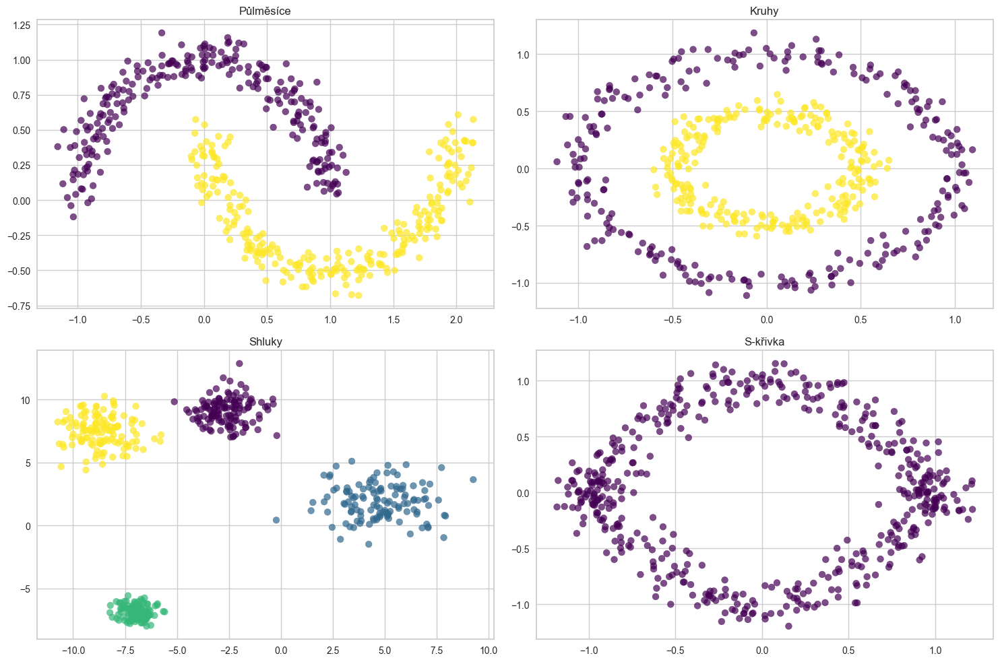

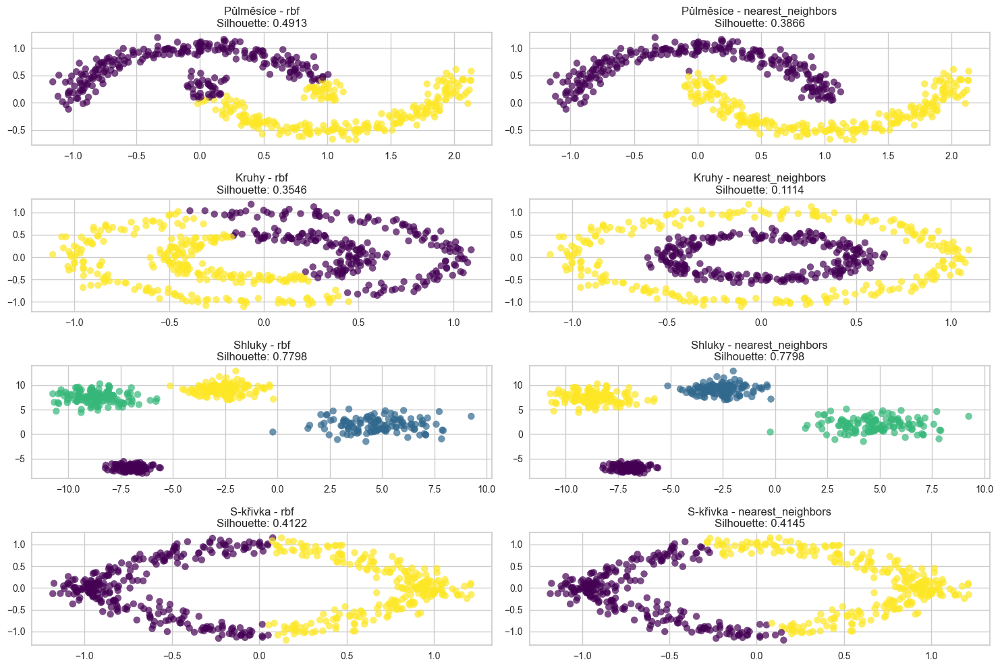

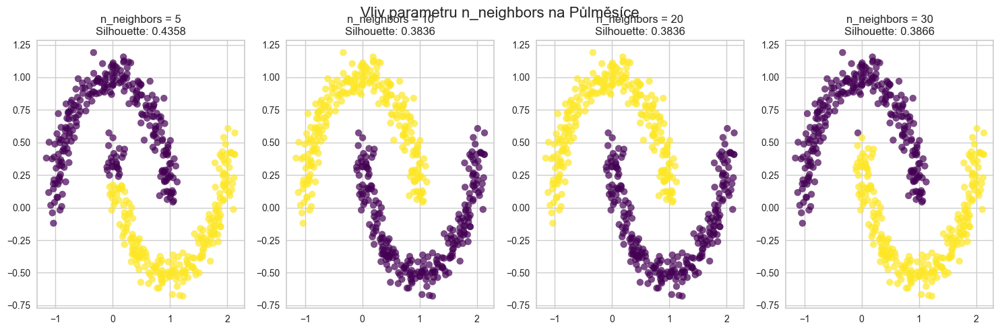

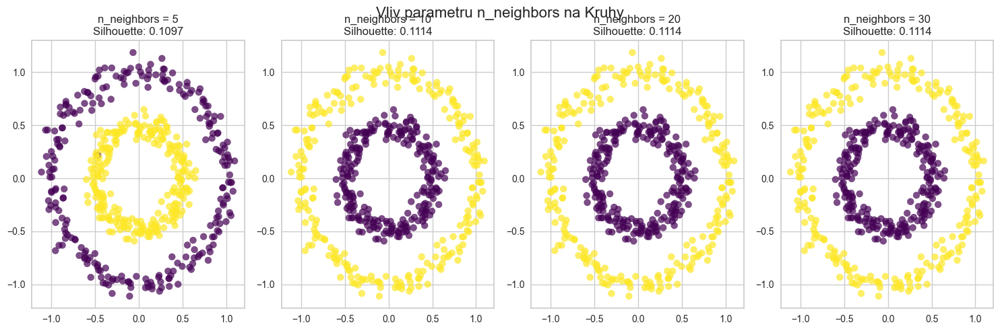

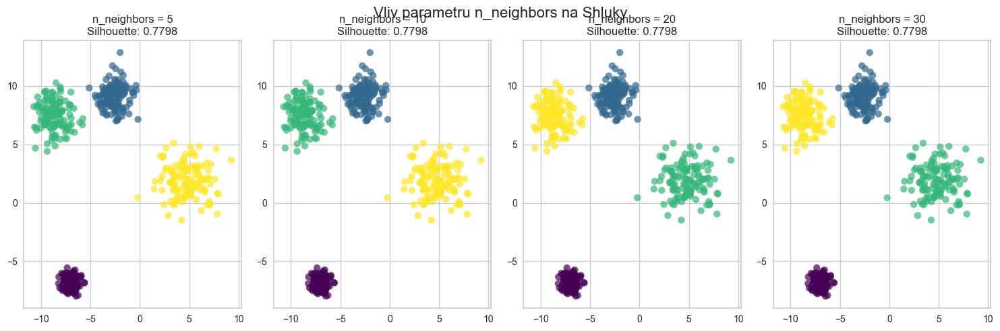

...

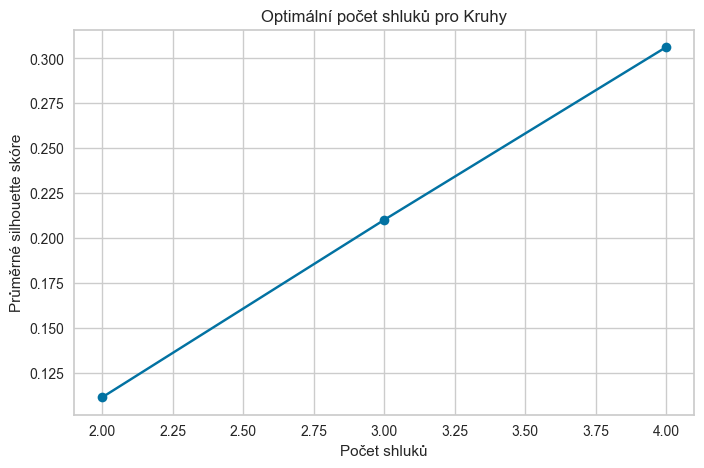

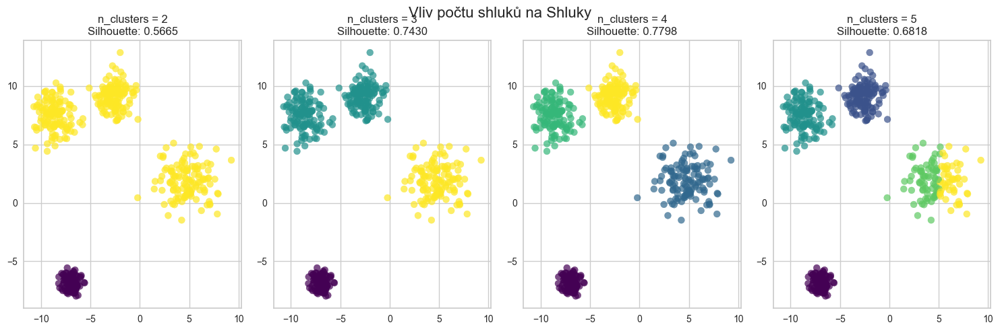

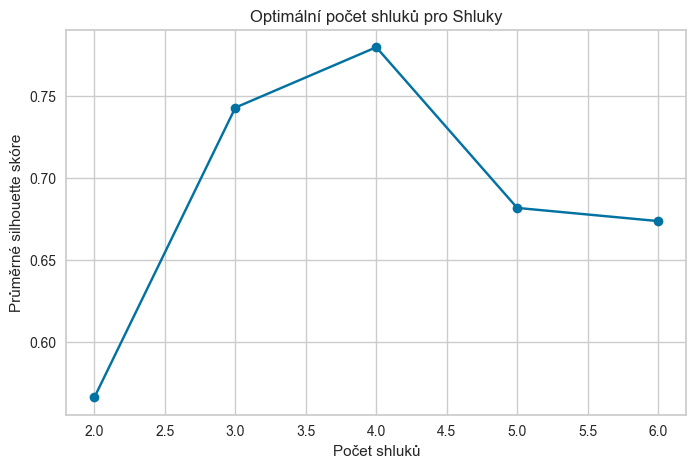

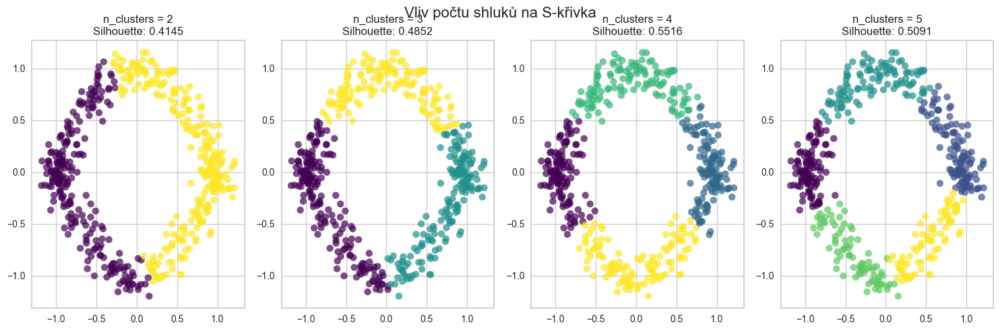

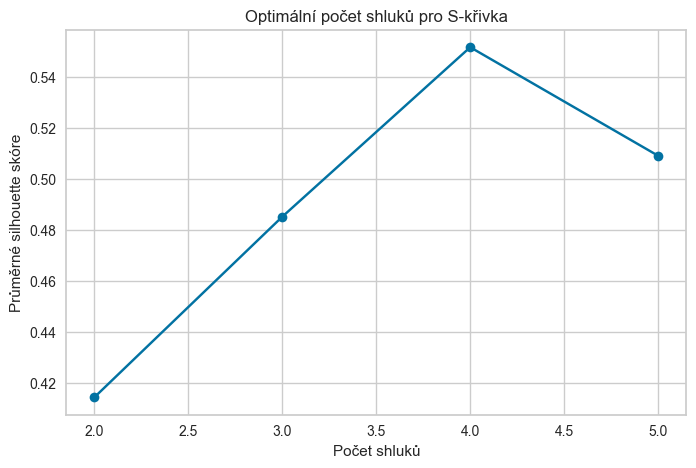

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import SpectralClustering
from sklearn.datasets import make_moons, make_circles, make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.neighbors import kneighbors_graph
from scipy.sparse import csgraph
from scipy import sparse
import warnings

# Suppress specific warnings
warnings.filterwarnings("ignore", message="Array is not symmetric, and will be converted to symmetric by average with its transpose.")
warnings.filterwarnings("ignore", message="Graph is not fully connected, spectral embedding may not work as expected.")

# Function to ensure the graph is fully connected
def make_fully_connected(connectivity_matrix):
    """
    Ensures a graph is fully connected by adding edges between disconnected components.
    
    Parameters:
        connectivity_matrix: sparse matrix representing the graph
        
    Returns:
        fully connected sparse matrix
    """
    # Identify connected components
    n_components, labels = csgraph.connected_components(connectivity_matrix, directed=False)
    
    # If already fully connected, return original matrix
    if n_components == 1:
        return connectivity_matrix
    
    # Convert to lil_matrix for efficient row modifications
    connectivity_lil = connectivity_matrix.tolil()
    
    # Find representative nodes from each component
    representatives = {}
    for i, label in enumerate(labels):
        if label not in representatives:
            representatives[label] = i
    
    # Connect components
    rep_nodes = list(representatives.values())
    for i in range(len(rep_nodes)-1):
        # Add bidirectional connections between representatives of components
        connectivity_lil[rep_nodes[i], rep_nodes[i+1]] = 1
        connectivity_lil[rep_nodes[i+1], rep_nodes[i]] = 1
    
    # Make sure the matrix is symmetric
    result = connectivity_lil.tocsr()
    result = 0.5 * (result + result.T)
    
    return result

# Vytvoření různých typů syntetických dat
n_samples = 500

# Dataset 1: Půlměsíce
X1, y1 = make_moons(n_samples=n_samples, noise=0.08, random_state=42)

# Dataset 2: Kruhy
X2, y2 = make_circles(n_samples=n_samples, noise=0.06, factor=0.5, random_state=42)

# Dataset 3: Shluky
X3, y3 = make_blobs(n_samples=n_samples, centers=4, 
                   cluster_std=[1.0, 1.5, 0.5, 1.2], random_state=42)

# Dataset 4: S-křivka
t = np.linspace(0, 2*np.pi, n_samples)
X4 = np.vstack([np.sin(t), np.sign(np.cos(t)) * (np.cos(t)) ** 2]).T
y4 = np.zeros(n_samples)
rng = np.random.RandomState(42)
X4 += 0.1 * rng.randn(n_samples, 2)

datasets = [
    ("Půlměsíce", X1, y1),
    ("Kruhy", X2, y2),
    ("Shluky", X3, y3),
    ("S-křivka", X4, y4)
]

# Vizualizace vstupních dat
plt.figure(figsize=(15, 10))
for i, (name, X, y) in enumerate(datasets):
    plt.subplot(2, 2, i+1)
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', s=50, alpha=0.7)
    plt.title(name)
plt.tight_layout()
plt.show()

# Porovnání různých typů afinity
affinities = ['rbf', 'nearest_neighbors']
n_clusters = 2  # Pro jednoduchost začneme se 2 shluky

plt.figure(figsize=(15, 10))
plot_num = 1

for name, X, _ in datasets:
    X_scaled = StandardScaler().fit_transform(X)
    
    for affinity in affinities:
        # Vytvoření a aplikace modelu
        model = SpectralClustering(
            n_clusters=n_clusters if name != "Shluky" else 4,
            affinity=affinity,
            assign_labels='kmeans',  # Explicitně nastavíme metodu přiřazení štítků
            random_state=42
        )
        
        # Pro affinity='nearest_neighbors', zajistíme, že graf je plně propojený
        if affinity == 'nearest_neighbors':
            # Vytvoříme graf sousedů s connect_disconnected=True pro zajištění plné konektivity
            n_neighbors_param = min(30, X_scaled.shape[0] - 1)  # Maximálně n-1 sousedů
            connectivity = kneighbors_graph(
                X_scaled, 
                n_neighbors=n_neighbors_param, 
                include_self=True,
                mode='connectivity'
            )
            # Zajistíme, že je matice symetrická a plně propojená
            connectivity = make_fully_connected(connectivity)
            model.set_params(affinity='precomputed')
            y_pred = model.fit_predict(connectivity.toarray())
        else:
            # Pro 'rbf' explicitně nastavíme parametry, aby nedocházelo k varováním
            model.set_params(gamma=1.0)
            y_pred = model.fit_predict(X_scaled)
        
        # Výpočet silhouette skóre
        silhouette_avg = silhouette_score(X_scaled, y_pred)
        
        # Vizualizace
        plt.subplot(4, 2, plot_num)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
        plt.title(f'{name} - {affinity}\nSilhouette: {silhouette_avg:.4f}')
        plot_num += 1

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

# Vliv parametru n_neighbors s afinitou nearest_neighbors
n_neighbors_list = [5, 10, 20, 30]

for name, X, _ in datasets:
    X_scaled = StandardScaler().fit_transform(X)
    
    plt.figure(figsize=(15, 5))
    for i, n_neigh in enumerate(n_neighbors_list):
        # Vytvoření konektivity s zajištěním symetrie a plné propojení
        connectivity = kneighbors_graph(
            X_scaled, 
            n_neighbors=n_neigh, 
            include_self=True,
            mode='connectivity'
        )
        # Zajistíme, že je graf plně propojený
        connectivity = make_fully_connected(connectivity)
        
        # Vytvoření a aplikace modelu
        model = SpectralClustering(
            n_clusters=n_clusters if name != "Shluky" else 4,
            affinity='precomputed',
            assign_labels='kmeans',
            random_state=42
        )
        y_pred = model.fit_predict(connectivity.toarray())
        
        # Výpočet silhouette skóre
        silhouette_avg = silhouette_score(X_scaled, y_pred)
        
        plt.subplot(1, 4, i+1)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
        plt.title(f'n_neighbors = {n_neigh}\nSilhouette: {silhouette_avg:.4f}')
    
    plt.suptitle(f"Vliv parametru n_neighbors na {name}", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# Vliv parametru gamma s afinitou rbf
gammas = [0.1, 0.5, 1.0, 5.0]

for name, X, _ in datasets:
    X_scaled = StandardScaler().fit_transform(X)
    
    plt.figure(figsize=(15, 5))
    for i, gamma in enumerate(gammas):
        # Vytvoření a aplikace modelu s explicitním nastavením eigensolveru
        model = SpectralClustering(
            n_clusters=n_clusters if name != "Shluky" else 4,
            affinity='rbf',
            gamma=gamma,
            assign_labels='kmeans',
            eigen_solver='arpack',  # Explicitní nastavení eigensolveru
            random_state=42
        )
        y_pred = model.fit_predict(X_scaled)
        
        # Výpočet silhouette skóre
        silhouette_avg = silhouette_score(X_scaled, y_pred)
        
        plt.subplot(1, 4, i+1)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
        plt.title(f'gamma = {gamma}\nSilhouette: {silhouette_avg:.4f}')
    
    plt.suptitle(f"Vliv parametru gamma na {name}", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# Porovnání různého počtu shluků
for name, X, _ in datasets:
    if name == "S-křivka":
        n_clusters_range = range(2, 6)
    elif name == "Shluky":
        n_clusters_range = range(2, 7)
    else:
        n_clusters_range = range(2, 5)
    
    X_scaled = StandardScaler().fit_transform(X)
    silhouette_scores = []
    
    plt.figure(figsize=(15, 5))
    for i, n_clust in enumerate(n_clusters_range):
        # Pro každý dataset vytvoříme vlastní typ afinity podle toho, co funguje nejlépe
        if name in ["Půlměsíce", "Kruhy", "S-křivka"]:
            # Pro tyto složitější tvary použijeme nearest_neighbors s plně propojeným grafem
            connectivity = kneighbors_graph(
                X_scaled, 
                n_neighbors=30, 
                include_self=True,
                mode='connectivity'
            )
            # Zajistíme, že je graf plně propojený
            connectivity = make_fully_connected(connectivity)
            
            model = SpectralClustering(
                n_clusters=n_clust,
                affinity='precomputed',
                assign_labels='kmeans',
                random_state=42
            )
            y_pred = model.fit_predict(connectivity.toarray())
        else:
            # Pro jednodušší shluky rbf funguje dobře s explicitně nastaveným parametrem eigen_solver
            model = SpectralClustering(
                n_clusters=n_clust,
                affinity='rbf',
                gamma=1.0,
                assign_labels='kmeans',
                eigen_solver='arpack',  # Explicitní nastavení řešiče
                random_state=42
            )
            y_pred = model.fit_predict(X_scaled)
        
        # Výpočet silhouette skóre
        silhouette_avg = silhouette_score(X_scaled, y_pred)
        silhouette_scores.append(silhouette_avg)
        
        if i < 4:  # Omezíme vizualizaci na první 4 hodnoty
            plt.subplot(1, 4, i+1)
            plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
            plt.title(f'n_clusters = {n_clust}\nSilhouette: {silhouette_avg:.4f}')
    
    plt.suptitle(f"Vliv počtu shluků na {name}", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()
    
    # Graf závislosti silhouette skóre na počtu shluků
    plt.figure(figsize=(8, 5))
    plt.plot(list(n_clusters_range), silhouette_scores, 'o-')
    plt.xlabel('Počet shluků')
    plt.ylabel('Průměrné silhouette skóre')
    plt.title(f'Optimální počet shluků pro {name}')
    plt.grid(True)
    plt.show()

## 5. GaussianMixture

### Popis

GaussianMixture představuje pravděpodobnostní model, který předpokládá, že data jsou generována z několika Gaussovských (normálních) rozdělení s neznámými parametry. Používá algoritmus Expectation-Maximization (EM) k nalezení těchto parametrů.

### Kdy a kde použít

- Když předpokládáte, že data jsou generována z několika normálních rozdělení
- Když potřebujete pravděpodobnostní přístup ke shlukování
- Pro soft clustering (určení pravděpodobnosti příslušnosti ke shluku)
- Pro detekci anomálií nebo zjištění hustoty pravděpodobnosti
- Pro modelování složitých vícerozměrných dat

### Výhody a nevýhody

**Výhody:**
- Poskytuje pravděpodobnosti příslušnosti bodu ke shluku
- Flexibilní díky kovarianční matici (různé tvary shluků)
- Přirozené teoretické zdůvodnění pomocí statistické teorie
- Umožňuje generování nových dat z naučeného modelu
- Umí pracovat s eliptickými shluky různých velikostí a orientací

**Nevýhody:**
- Předpokládá gaussovské rozdělení dat
- Citlivý na inicializaci (může uvíznout v lokálním optimu)
- Může mít problémy s konvergencí
- Problematický pro shluky s nepravidelným tvarem
- Vyžaduje předem určení počtu komponent

### Ukázka kódu

In [8]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.mixture import GaussianMixture
# from sklearn.datasets import make_blobs
# from sklearn.preprocessing import StandardScaler
# from matplotlib.colors import LogNorm
# from sklearn.metrics import silhouette_score
# from sklearn.model_selection import ParameterGrid
# import matplotlib.patches as patches
# from scipy import linalg

# # Generování syntetických dat
# n_samples = 500

# # Dataset 1: Jednoduchá gaussovská data
# X1, y1 = make_blobs(n_samples=n_samples, centers=3, 
#                    cluster_std=[1.0, 1.5, 0.5], random_state=42)

# # Dataset 2: Dva blízké gaussovské shluky
# X2_1, _ = make_blobs(n_samples=int(n_samples*0.4), centers=1, 
#                     cluster_std=0.5, center_box=(-2, -2), random_state=42)
# X2_2, _ = make_blobs(n_samples=int(n_samples*0.6), centers=1, 
#                     cluster_std=1.0, center_box=(1, 1), random_state=42)
# X2 = np.vstack([X2_1, X2_2])
# y2 = np.hstack([np.zeros(X2_1.shape[0]), np.ones(X2_2.shape[0])])

# # Dataset 3: Eliptické shluky
# rng = np.random.RandomState(42)
# X3 = np.dot(rng.randn(n_samples, 2), [[2, 0], [0, 0.5]])
# X3 = np.vstack([X3, np.dot(rng.randn(n_samples, 2), [[1, 0], [0, 3]]) + [5, 5]])
# y3 = np.hstack([np.zeros(n_samples), np.ones(n_samples)])

# # Kombinovaný dataset pro demonstraci výběru počtu komponent
# X_combined = np.vstack([
#     np.dot(rng.randn(300, 2), [[2, 0], [0, 0.5]]),
#     np.dot(rng.randn(300, 2), [[1, 0], [0, 3]]) + [5, 5],
#     np.dot(rng.randn(300, 2), [[1, 0], [0, 1]]) + [-5, 5],
#     np.random.randn(100, 2) * 0.5 + [-2, -2]
# ])

# datasets = [
#     ("Jednoduché shluky", X1, y1),
#     ("Dva blízké shluky", X2, y2),
#     ("Eliptické shluky", X3, y3)
# ]

# # Standardizace dat
# X_combined_scaled = StandardScaler().fit_transform(X_combined)

# # Funkce pro vizualizaci GMM
# def plot_gmm(gmm, X, title):
#     plt.figure(figsize=(10, 8))
    
#     # Vytvoření mřížky pro zobrazení hustoty pravděpodobnosti
#     x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
#     y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
#     xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
#                          np.linspace(y_min, y_max, 100))
    
#     # Výpočet log-likelihood pro každý bod mřížky
#     Z = -gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
#     Z = Z.reshape(xx.shape)
    
#     # Vykreslení kontur hustoty pravděpodobnosti
#     plt.contourf(xx, yy, Z, levels=50, cmap='viridis_r')
    
#     # Predikce shluků
#     y_pred = gmm.predict(X)
#     plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=30, edgecolors='k', alpha=0.7)
    
#     # Vykreslení gaussovských komponent
#     for i, (mean, covar) in enumerate(zip(gmm.means_, gmm.covariances_)):
#         v, w = linalg.eigh(covar)
#         v = 2. * np.sqrt(2.) * np.sqrt(v)
#         u = w[0] / linalg.norm(w[0])
#         angle = np.arctan(u[1] / u[0]) * 180 / np.pi
        
#         # Vytvoření elipsy
#         ellipse = patches.Ellipse(mean, v[0], v[1], angle=180+angle, 
#                                   fill=False, color='black', linewidth=2)
#         plt.gca().add_patch(ellipse)
    
#     plt.title(title)
#     plt.xlabel('X1')
#     plt.ylabel('X2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()

# # Vizualizace datových sad
# plt.figure(figsize=(15, 5))
# for i, (name, X, y) in enumerate(datasets):
#     plt.subplot(1, 3, i+1)
#     plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', s=50, alpha=0.7)
#     plt.title(name)
# plt.tight_layout()
# plt.show()

# # Porovnání různých typů kovarianční matice pro GaussianMixture
# covariance_types = ['full', 'tied', 'diag', 'spherical']

# plt.figure(figsize=(15, 15))
# plot_idx = 1

# for name, X, _ in datasets:
#     X_scaled = StandardScaler().fit_transform(X)
#     n_components = 3 if name == "Jednoduché shluky" else 2
    
#     for cov_type in covariance_types:
#         # Vytvoření a trénování modelu
#         gmm = GaussianMixture(
#             n_components=n_components,
#             covariance_type=cov_type,
#             random_state=42,
#             max_iter=100,
#             n_init=10
#         )
#         gmm.fit(X_scaled)
#         y_pred = gmm.predict(X_scaled)
        
#         # Výpočet BIC a silhouette skóre
#         bic = gmm.bic(X_scaled)
#         silhouette_avg = silhouette_score(X_scaled, y_pred)
        
#         # Vizualizace
#         plt.subplot(3, 4, plot_idx)
#         plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
#         plt.title(f'{name}\n{cov_type}\nBIC: {bic:.0f}, Silhouette: {silhouette_avg:.4f}')
#         plot_idx += 1

# plt.tight_layout()
# plt.show()

# # Porovnání metod pro určení optimálního počtu komponent
# n_components_range = range(1, 10)
# bic_scores = []
# aic_scores = []
# silhouette_scores = []

# for n_comp in n_components_range:
#     gmm = GaussianMixture(
#         n_components=n_comp,
#         covariance_type='full',
#         random_state=42,
#         max_iter=100,
#         n_init=10
#     )
#     gmm.fit(X_combined_scaled)
    
#     bic_scores.append(gmm.bic(X_combined_scaled))
#     aic_scores.append(gmm.aic(X_combined_scaled))
    
#     # Silhouette skóre můžeme počítat pouze pro n_components >= 2
#     if n_comp >= 2:
#         y_pred = gmm.predict(X_combined_scaled)
#         silhouette_scores.append(silhouette_score(X_combined_scaled, y_pred))
#     else:
#         silhouette_scores.append(0)  # Pro n_comp=1 nastavíme 0

# plt.figure(figsize=(15, 5))

# plt.subplot(1, 3, 1)
# plt.plot(n_components_range, bic_scores, 'o-')
# plt.xlabel('Počet komponent')
# plt.ylabel('BIC skóre')
# plt.title('BIC kritérium')
# plt.grid(True)

# plt.subplot(1, 3, 2)
# plt.plot(n_components_range, aic_scores, 'o-')
# plt.xlabel('Počet komponent')
# plt.ylabel('AIC skóre')
# plt.title('AIC kritérium')
# plt.grid(True)

# plt.subplot(1, 3, 3)
# plt.plot(n_components_range[1:], silhouette_scores[1:], 'o-')  # Začínáme od n_comp=2
# plt.xlabel('Počet komponent')
# plt.ylabel('Silhouette skóre')
# plt.title('Silhouette kritérium')
# plt.grid(True)

# plt.tight_layout()
# plt.show()

# # Optimální model podle BIC
# best_n_components = np.argmin(bic_scores) + 1
# print(f"Optimální počet komponent podle BIC: {best_n_components}")

# # Aplikace optimálního modelu
# best_gmm = GaussianMixture(
#     n_components=best_n_components,
#     covariance_type='full',
#     random_state=42,
#     max_iter=100,
#     n_init=10
# )
# best_gmm.fit(X_combined_scaled)
# X_combined_original = StandardScaler().inverse_transform(X_combined_scaled)

# # Vizualizace výsledků pomocí hustoty pravděpodobnosti
# plot_gmm(best_gmm, X_combined_original, f'Gaussian Mixture s {best_n_components} komponentami')

# # Ukázka generování nových dat z naučeného modelu
# X_new, y_new = best_gmm.sample(500)
# X_new = StandardScaler().fit(X_combined_scaled).inverse_transform(X_new)

# plt.figure(figsize=(12, 6))
# plt.subplot(1, 2, 1)
# plt.scatter(X_combined_original[:, 0], X_combined_original[:, 1], c=best_gmm.predict(X_combined_scaled),
#            cmap='viridis', s=30, alpha=0.7)
# plt.title('Původní data')
# plt.grid(True)

# plt.subplot(1, 2, 2)
# plt.scatter(X_new[:, 0], X_new[:, 1], c=y_new, cmap='viridis', s=30, alpha=0.7)
# plt.title('Generovaná data')
# plt.grid(True)

# plt.tight_layout()
# plt.show()

```
NotFittedError: This StandardScaler instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.
```

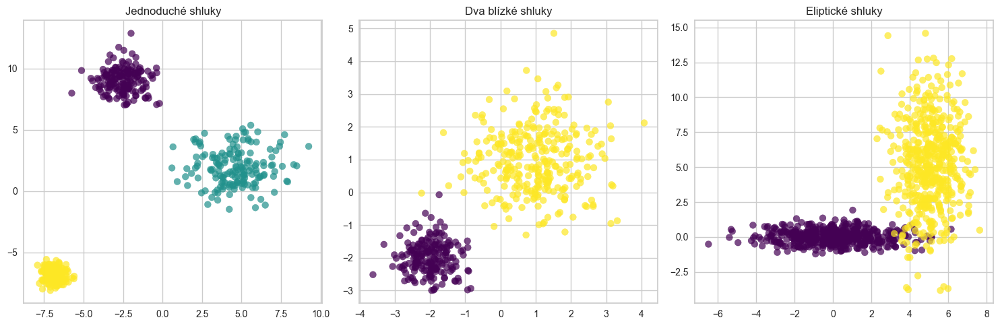

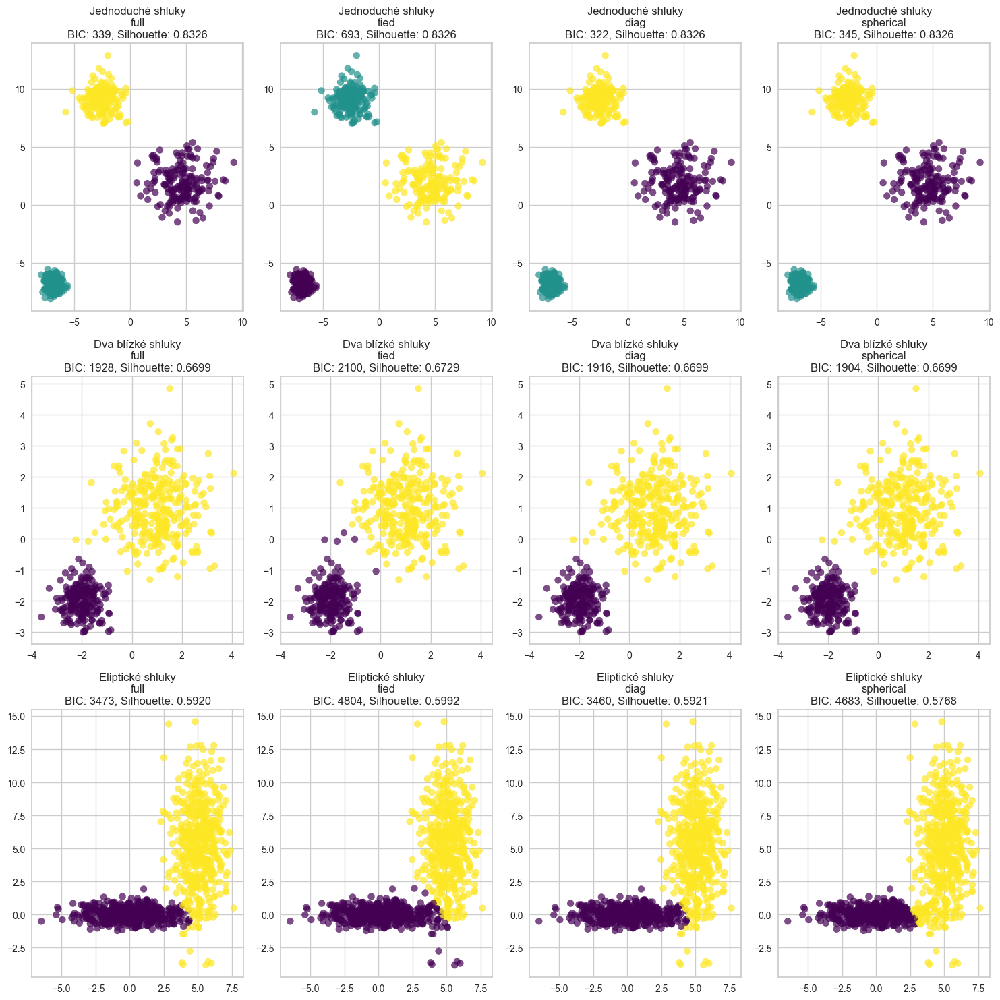

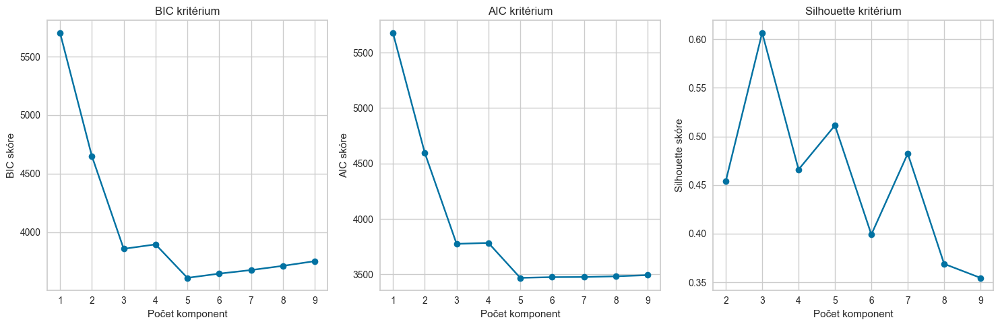

Optimální počet komponent podle BIC: 5


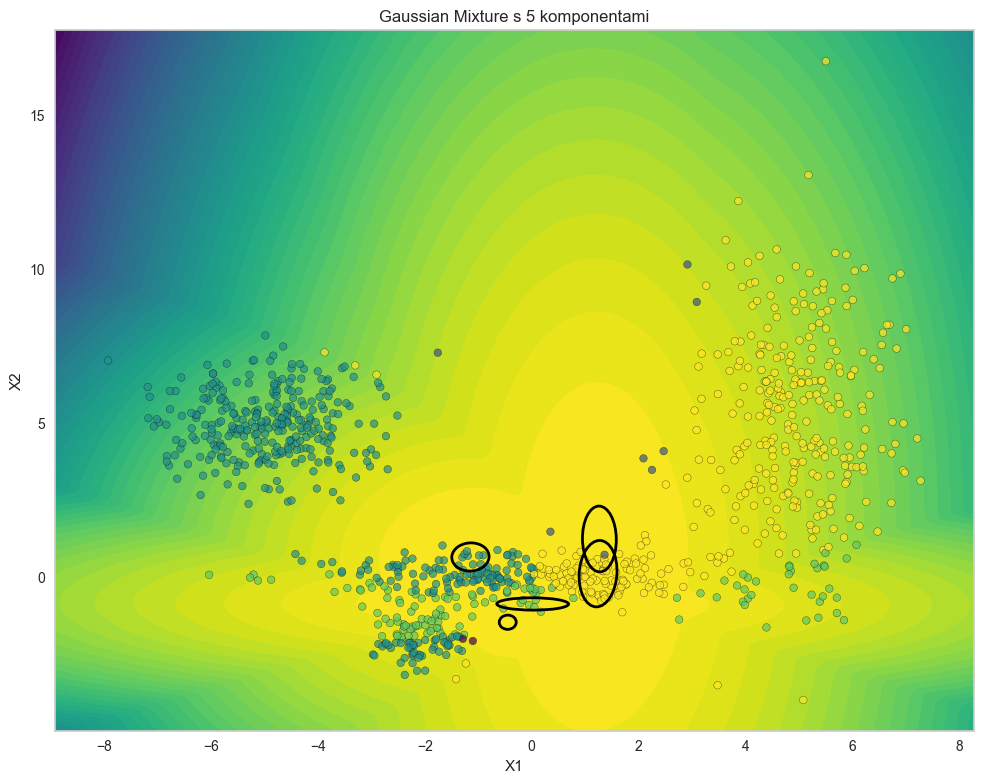

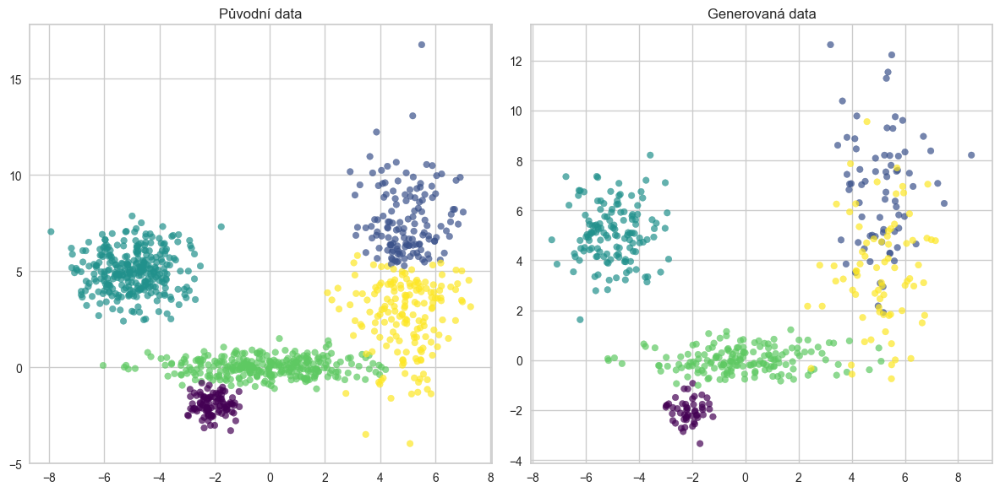

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from matplotlib.colors import LogNorm
from sklearn.metrics import silhouette_score
from sklearn.model_selection import ParameterGrid
import matplotlib.patches as patches
from scipy import linalg

# Generování syntetických dat
n_samples = 500

X1, y1 = make_blobs(n_samples=n_samples, centers=3, 
                   cluster_std=[1.0, 1.5, 0.5], random_state=42)

X2_1, _ = make_blobs(n_samples=int(n_samples*0.4), centers=1, 
                    cluster_std=0.5, center_box=(-2, -2), random_state=42)
X2_2, _ = make_blobs(n_samples=int(n_samples*0.6), centers=1, 
                    cluster_std=1.0, center_box=(1, 1), random_state=42)
X2 = np.vstack([X2_1, X2_2])
y2 = np.hstack([np.zeros(X2_1.shape[0]), np.ones(X2_2.shape[0])])

rng = np.random.RandomState(42)
X3 = np.dot(rng.randn(n_samples, 2), [[2, 0], [0, 0.5]])
X3 = np.vstack([X3, np.dot(rng.randn(n_samples, 2), [[1, 0], [0, 3]]) + [5, 5]])
y3 = np.hstack([np.zeros(n_samples), np.ones(n_samples)])

X_combined = np.vstack([
    np.dot(rng.randn(300, 2), [[2, 0], [0, 0.5]]),
    np.dot(rng.randn(300, 2), [[1, 0], [0, 3]]) + [5, 5],
    np.dot(rng.randn(300, 2), [[1, 0], [0, 1]]) + [-5, 5],
    np.random.randn(100, 2) * 0.5 + [-2, -2]
])

datasets = [
    ("Jednoduché shluky", X1, y1),
    ("Dva blízké shluky", X2, y2),
    ("Eliptické shluky", X3, y3)
]

# Standardizace dat
scaler_combined = StandardScaler()  # FIX: vytvoření scaleru
X_combined_scaled = scaler_combined.fit_transform(X_combined)  # FIX: fit + transform

def plot_gmm(gmm, X, title):
    plt.figure(figsize=(10, 8))
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                         np.linspace(y_min, y_max, 100))
    Z = -gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, levels=50, cmap='viridis_r')
    y_pred = gmm.predict(X)
    plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=30, edgecolors='k', alpha=0.7)

    for i, (mean, covar) in enumerate(zip(gmm.means_, gmm.covariances_)):
        v, w = linalg.eigh(covar)
        v = 2. * np.sqrt(2.) * np.sqrt(v)
        u = w[0] / linalg.norm(w[0])
        angle = np.arctan(u[1] / u[0]) * 180 / np.pi
        ellipse = patches.Ellipse(mean, v[0], v[1], angle=180+angle, 
                                  fill=False, color='black', linewidth=2)
        plt.gca().add_patch(ellipse)

    plt.title(title)
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plt.figure(figsize=(15, 5))
for i, (name, X, y) in enumerate(datasets):
    plt.subplot(1, 3, i+1)
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', s=50, alpha=0.7)
    plt.title(name)
plt.tight_layout()
plt.show()

covariance_types = ['full', 'tied', 'diag', 'spherical']
plt.figure(figsize=(15, 15))
plot_idx = 1

for name, X, _ in datasets:
    X_scaled = StandardScaler().fit_transform(X)
    n_components = 3 if name == "Jednoduché shluky" else 2

    for cov_type in covariance_types:
        gmm = GaussianMixture(
            n_components=n_components,
            covariance_type=cov_type,
            random_state=42,
            max_iter=100,
            n_init=10
        )
        gmm.fit(X_scaled)
        y_pred = gmm.predict(X_scaled)
        bic = gmm.bic(X_scaled)
        silhouette_avg = silhouette_score(X_scaled, y_pred)
        plt.subplot(3, 4, plot_idx)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='viridis', s=50, alpha=0.7)
        plt.title(f'{name}\n{cov_type}\nBIC: {bic:.0f}, Silhouette: {silhouette_avg:.4f}')
        plot_idx += 1

plt.tight_layout()
plt.show()

n_components_range = range(1, 10)
bic_scores = []
aic_scores = []
silhouette_scores = []

for n_comp in n_components_range:
    gmm = GaussianMixture(
        n_components=n_comp,
        covariance_type='full',
        random_state=42,
        max_iter=100,
        n_init=10
    )
    gmm.fit(X_combined_scaled)
    bic_scores.append(gmm.bic(X_combined_scaled))
    aic_scores.append(gmm.aic(X_combined_scaled))
    if n_comp >= 2:
        y_pred = gmm.predict(X_combined_scaled)
        silhouette_scores.append(silhouette_score(X_combined_scaled, y_pred))
    else:
        silhouette_scores.append(0)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(n_components_range, bic_scores, 'o-')
plt.xlabel('Počet komponent')
plt.ylabel('BIC skóre')
plt.title('BIC kritérium')
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(n_components_range, aic_scores, 'o-')
plt.xlabel('Počet komponent')
plt.ylabel('AIC skóre')
plt.title('AIC kritérium')
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(n_components_range[1:], silhouette_scores[1:], 'o-')
plt.xlabel('Počet komponent')
plt.ylabel('Silhouette skóre')
plt.title('Silhouette kritérium')
plt.grid(True)

plt.tight_layout()
plt.show()

best_n_components = np.argmin(bic_scores) + 1
print(f"Optimální počet komponent podle BIC: {best_n_components}")

best_gmm = GaussianMixture(
    n_components=best_n_components,
    covariance_type='full',
    random_state=42,
    max_iter=100,
    n_init=10
)
best_gmm.fit(X_combined_scaled)

# FIX: použijeme původní scaler pro inverzi
X_combined_original = scaler_combined.inverse_transform(X_combined_scaled)

plot_gmm(best_gmm, X_combined_original, f'Gaussian Mixture s {best_n_components} komponentami')

# Ukázka generování nových dat z modelu
X_new, y_new = best_gmm.sample(500)

# FIX: použijeme původní scaler pro generovaná data
X_new = scaler_combined.inverse_transform(X_new)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(X_combined_original[:, 0], X_combined_original[:, 1], c=best_gmm.predict(X_combined_scaled),
           cmap='viridis', s=30, alpha=0.7)
plt.title('Původní data')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.scatter(X_new[:, 0], X_new[:, 1], c=y_new, cmap='viridis', s=30, alpha=0.7)
plt.title('Generovaná data')
plt.grid(True)

plt.tight_layout()
plt.show()

## Srovnávací tabulka shlukovacích algoritmů

| Algoritmus | Tvar shluků | Škálovatelnost | Odolnost vůči šumu | Předem známý počet shluků | Interpretovatelnost | Hlavní výhody | Hlavní nevýhody |
|------------|-------------|----------------|---------------------|--------------------------|---------------------|--------------|----------------|
| KMeans | Kulovité, podobné velikosti | Vysoká | Nízká | Ano | Vysoká | Rychlost, jednoduchost, škálovatelnost | Pevný počet shluků, citlivý na inicializaci a odlehlé hodnoty |
| DBSCAN | Libovolný | Střední | Vysoká | Ne | Střední | Detekce šumu, automatický počet shluků, libovolné tvary | Citlivý na parametry, horší pro data s různou hustotou |
| AgglomerativeClustering | Libovolný | Nízká | Nízká | Volitelně | Vysoká | Hierarchický výsledek, flexibilní metriky, vizualizace dendrogramem | Výpočetně náročný, nevratná rozhodnutí |
| SpectralClustering | Libovolný | Nízká | Střední | Ano | Nízká | Zachycení komplexních struktur, nepravidelné tvary | Výpočetně náročný, problémy s pamětí, složité nastavení |
| GaussianMixture | Eliptické | Střední | Střední | Ano | Střední | Pravděpodobnostní přístup, generativní model, soft clustering | Předpokládá normální rozdělení, citlivý na inicializaci |